# **UNVEILING CUSTOMER CHURN**

## **Problem statement:**
An E Commerce company or DTH (you can choose either of these two domains) provider is facing a lot of competition in the current market and it has become a challenge to retain the existing customers in the current situation. Hence, the company wants to develop a model through which they can do churn prediction of the accounts and provide segmented offers to the potential churners. In this company, account churn is a major thing because 1 account can have multiple customers. hence by losing one account the company might be losing more than one customer.

You have been assigned to develop a churn prediction model for this company and provide business recommendations on the campaign. Your campaign suggestion should be unique and be very clear on the campaign offer because your recommendation will go through the revenue assurance team. If they find that you are giving a lot of free (or subsidized) stuff thereby making a loss to the company; they are not going to approve your recommendation.

Hence be very careful while providing campaign recommendation.


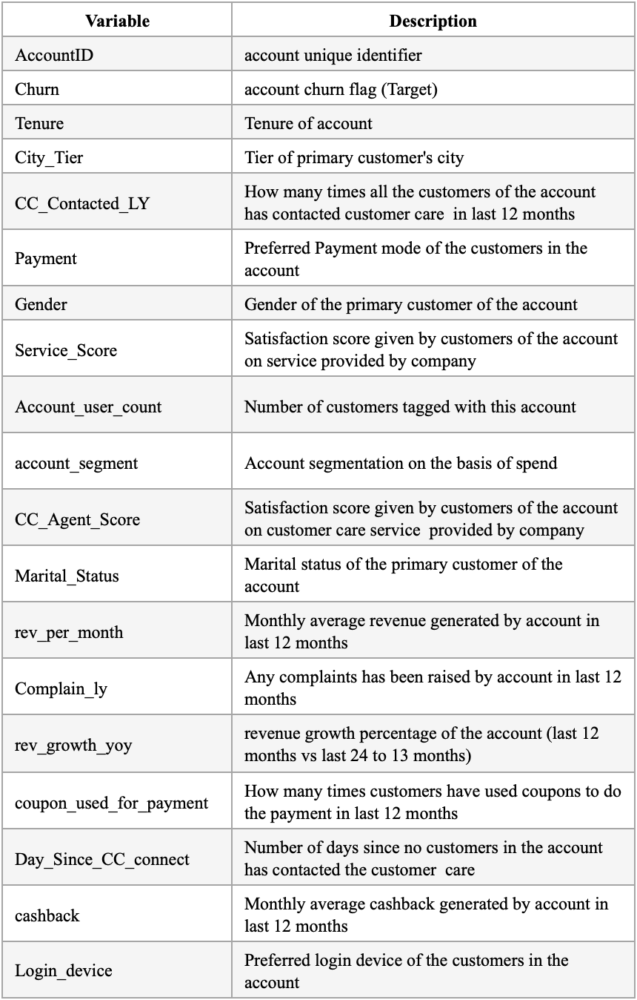


---
---

## Installing and Importing Dependencies

In [ ]:
!pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 14.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=5f037f223a14c566613062b99473aedfadc3f3d4cdb2424a4a48e0480139e5f6
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport

## Loading the data into notebook

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Jain/data/Customer_Churn_Data.xlsx', 'Data for DSBA')

## Few observations on the dataset

In [ ]:
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [ ]:
df.columns

Index(['AccountID', 'Churn', 'Tenure', 'City_Tier', 'CC_Contacted_LY',
       'Payment', 'Gender', 'Service_Score', 'Account_user_count',
       'account_segment', 'CC_Agent_Score', 'Marital_Status', 'rev_per_month',
       'Complain_ly', 'rev_growth_yoy', 'coupon_used_for_payment',
       'Day_Since_CC_connect', 'cashback', 'Login_device'],
      dtype='object')

In [ ]:
df.ndim

2

In [ ]:
df.size

213940

In [ ]:
len(df)

11260

In [ ]:
df.shape

(11260, 19)

## Checking the data type of each column

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

> Insights:

There are 7 numerical columns and 12 categorical columns.

## Statistical analysis of numeric columns on the dataset

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11260.0,25629.500000,3250.626350,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.0,0.00,1.0
City_Tier,11148.0,1.653929,0.915015,1.0,1.00,1.0,3.00,3.0
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.00,16.0,23.00,132.0
Service_Score,11162.0,2.902526,0.725584,0.0,2.00,3.0,3.00,5.0
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.00,3.0,4.00,5.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.0,1.00,1.0


## Statistical analysis of categorical columns on the dataset

In [ ]:
df.describe(include='O').T

,count,unique,top,freq
Tenure,11158,38,1,1351
Payment,11151,5,Debit Card,4587
Gender,11152,4,Male,6328
Account_user_count,11148,7,4,4569
account_segment,11163,7,Super,4062
Marital_Status,11048,3,Married,5860
rev_per_month,11158,59,3,1746
rev_growth_yoy,11260,20,14,1524
coupon_used_for_payment,11260,20,1,4373
Day_Since_CC_connect,10903,24,3,1816


## Data Cleaning

In [ ]:
for column in df.select_dtypes('object'):
    print(f'{column}: {df[column].nunique()}')
    print(f'{df[column].unique()}')
    print('\n\n')

Tenure: 38
[4 0 2 13 11 '#' 9 99 19 20 14 8 26 18 5 30 7 1 23 3 29 6 28 24 25 16 10
 15 22 nan 27 12 21 17 50 60 31 51 61]



Payment: 5
['Debit Card' 'UPI' 'Credit Card' 'Cash on Delivery' 'E wallet' nan]



Gender: 4
['Female' 'Male' 'F' nan 'M']



Account_user_count: 7
[3 4 nan 5 2 '@' 1 6]



account_segment: 7
['Super' 'Regular Plus' 'Regular' 'HNI' 'Regular +' nan 'Super Plus'
 'Super +']



Marital_Status: 3
['Single' 'Divorced' 'Married' nan]



rev_per_month: 59
[9 7 6 8 3 2 4 10 1 5 '+' 130 nan 19 139 102 120 138 127 123 124 116 21
 126 134 113 114 108 140 133 129 107 118 11 105 20 119 121 137 110 22 101
 136 125 14 13 12 115 23 122 117 131 104 15 25 135 111 109 100 103]



rev_growth_yoy: 20
[11 15 14 23 22 16 12 13 17 18 24 19 20 21 25 26 '$' 4 27 28]



coupon_used_for_payment: 20
[1 0 4 2 9 6 11 7 12 10 5 3 13 15 8 '#' '$' 14 '*' 16]



Day_Since_CC_connect: 24
[5 0 3 7 2 1 8 6 4 15 nan 11 10 9 13 12 17 16 14 30 '$' 46 18 31 47]



cashback: 5693
[159.93 120.9 nan ... 22

### Correcting all the categorical variables with special symbols

#### Treating 'Tenure' column

* As you can see there is '#' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '#s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['Tenure'] = df['Tenure'].replace('#', np.nan)

df['Tenure'].unique()

array([ 4.,  0.,  2., 13., 11., nan,  9., 99., 19., 20., 14.,  8., 26.,
       18.,  5., 30.,  7.,  1., 23.,  3., 29.,  6., 28., 24., 25., 16.,
       10., 15., 22., 27., 12., 21., 17., 50., 60., 31., 51., 61.])

#### Treating 'Gender' column

* As we can see 'F' and 'M' are also known as 'Female' and 'Male'.

In [ ]:
df['Gender'] = df['Gender'].replace('F', 'Female')
df['Gender'] = df['Gender'].replace('M', 'Male')

df['Gender'].unique()

array(['Female', 'Male', nan], dtype=object)

#### Treating 'Account_user_count' column

* As you can see there is '@' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '@s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['Account_user_count'] = df['Account_user_count'].replace('@', np.nan)

df['Account_user_count'].unique()

array([ 3.,  4., nan,  5.,  2.,  1.,  6.])

#### Treating 'account_segment' column

* As you can see there is 'Regular +' and 'Super +' symbol need to be treated as 'Regular Plus' and 'Super Plus'.
* Since 'Regular +' is nothing but 'Regular Plus' and same in case of 'Super +'.

In [ ]:
df['account_segment'] = df['account_segment'].replace('Regular +', 'Regular Plus')
df['account_segment'] = df['account_segment'].replace('Super +', 'Super Plus')

df['account_segment'].unique()

array(['Super', 'Regular Plus', 'Regular', 'HNI', nan, 'Super Plus'],
      dtype=object)

#### Treating 'rev_per_month' column

* As you can see there is '+' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '+s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['rev_per_month'] = df['rev_per_month'].replace('+', np.nan)

df['rev_per_month'].unique()

array([  9.,   7.,   6.,   8.,   3.,   2.,   4.,  10.,   1.,   5.,  nan,
       130.,  19., 139., 102., 120., 138., 127., 123., 124., 116.,  21.,
       126., 134., 113., 114., 108., 140., 133., 129., 107., 118.,  11.,
       105.,  20., 119., 121., 137., 110.,  22., 101., 136., 125.,  14.,
        13.,  12., 115.,  23., 122., 117., 131., 104.,  15.,  25., 135.,
       111., 109., 100., 103.])

#### Treating 'rev_growth_yoy' column

* As you can see there is '\$' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '\$s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['rev_growth_yoy'] = df['rev_growth_yoy'].replace('$', np.nan)

df['rev_growth_yoy'].unique()

array([11., 15., 14., 23., 22., 16., 12., 13., 17., 18., 24., 19., 20.,
       21., 25., 26., nan,  4., 27., 28.])

#### Treating 'coupon_used_for_payment' column

* As you can see there is '#', '\$' and '*' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '#s', '\$s' and '*s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['coupon_used_for_payment'] = df['coupon_used_for_payment'].replace('*', np.nan)
df['coupon_used_for_payment'] = df['coupon_used_for_payment'].replace('#', np.nan)
df['coupon_used_for_payment'] = df['coupon_used_for_payment'].replace('$', np.nan)

df['coupon_used_for_payment'].unique()

array([ 1.,  0.,  4.,  2.,  9.,  6., 11.,  7., 12., 10.,  5.,  3., 13.,
       15.,  8., nan, 14., 16.])

#### Treating 'Day_Since_CC_connect' column

* As you can see there is '\$' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '\$s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['Day_Since_CC_connect'] = df['Day_Since_CC_connect'].replace('$', np.nan)

df['Day_Since_CC_connect'].unique()

array([ 5.,  0.,  3.,  7.,  2.,  1.,  8.,  6.,  4., 15., nan, 11., 10.,
        9., 13., 12., 17., 16., 14., 30., 46., 18., 31., 47.])

#### Treating 'cashback' column

* First need to know what is the special character.
* As you can see there is '\$' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '\$s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
for data in df['cashback'].unique():
    if not isinstance(data, (int, float)):
        print(data)

$


In [ ]:
df['cashback'] = df['cashback'].replace('$', np.nan)

df['cashback'].unique()

array([159.93, 120.9 ,    nan, ..., 227.36, 226.91, 191.42])

#### Treating 'Login_device' column

* As you can see there is '&&&&' symbol need to be treated as 'np.nan' value and we can perform imputation in future.
* Once the '&&&&s' are converted to 'np.nan', this column will be converted to numerical column.

In [ ]:
df['Login_device'] = df['Login_device'].replace('&&&&', np.nan)

df['Login_device'].unique()

array(['Mobile', 'Computer', nan], dtype=object)

## Exploratory Data Analysis (EDA)

### Pandas Profiling

In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Univariate Analysis

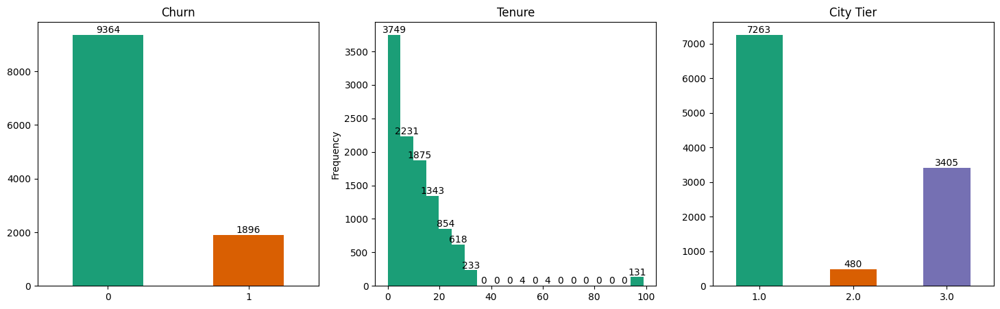

In [ ]:
# @title 1st Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - Imbalance dataset, as `Churn` samples are less. <br>
# @markdown > Plot 2 - More number of customers are falling under less `Tenure`. <br>
# @markdown > Plot 3 - More number of customers are from `City Tier 1` followed by `City Tier 3` and followed by `City Tier 2`.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('Churn').size().plot(kind='bar', rot='horizontal', title='Churn',
                                     color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

# 2nd Column
plt.subplot(1, 3, 2)
ax = df['Tenure'].plot(kind='hist', bins=20, title='Tenure',
                       color=sns.palettes.mpl_palette('Dark2'))
ax.bar_label(ax.containers[0]);

# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('City_Tier').size().plot(kind='bar', rot='horizontal', title='City Tier',
                                        color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

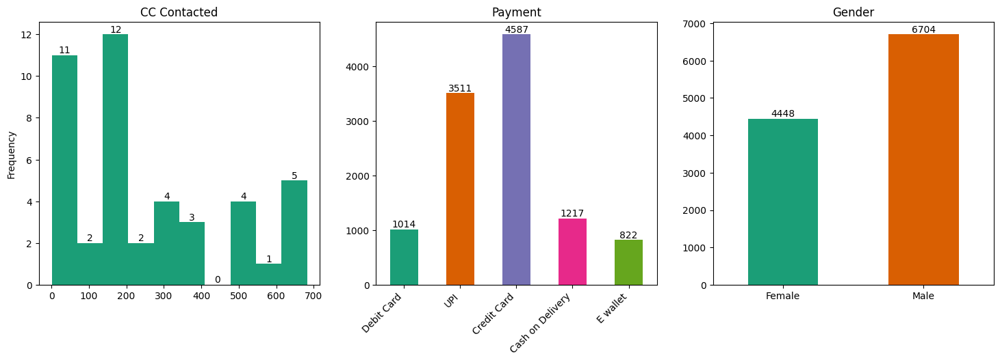

In [ ]:
# @title 2nd Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - `CC_Contacted` doesn't follow any distribution. <br>
# @markdown > Plot 2 - Most of the customers preferred `Payment` using `credit card` followed by `UPI`. <br>
# @markdown > Plot 3 - Most of the customers are `Male`.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('CC_Contacted_LY').size().plot(kind='hist', rot='horizontal',
                                                    title='CC Contacted',
                                                    color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 2nd Column
plt.subplot(1, 3, 2)
ax = df.groupby('Payment').size().plot(kind='bar', rot='horizontal', title='Payment',
                                      color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.set_xticklabels(df['Payment'].unique()[:-1], rotation=45, ha='right')
ax.bar_label(ax.containers[0]);


# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('Gender').size().plot(kind='bar', rot='horizontal', title='Gender',
                                      color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

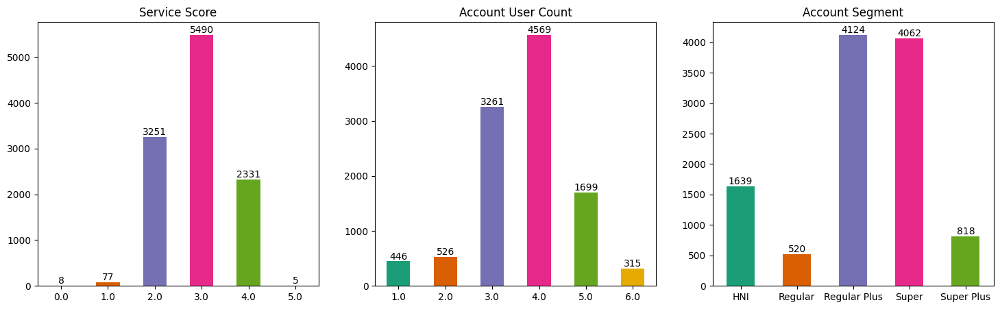

In [ ]:
# @title 3rd Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - Most of the customers provided `Service Score` as `3`. <br>
# @markdown > Plot 2 - Most of the customers using `4` accounts. <br>
# @markdown > Plot 3 - Most of the customers are under `Regular Plus` and `Super` Account Segment.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('Service_Score').size().plot(kind='bar', rot='horizontal',
                                                    title='Service Score',
                                                    color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 2nd Column
plt.subplot(1, 3, 2)
ax = df.groupby('Account_user_count').size().plot(kind='bar', rot='horizontal',
                                                  title='Account User Count',
                                                  color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('account_segment').size().plot(kind='bar', rot='horizontal', title='Account Segment',
                                      color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

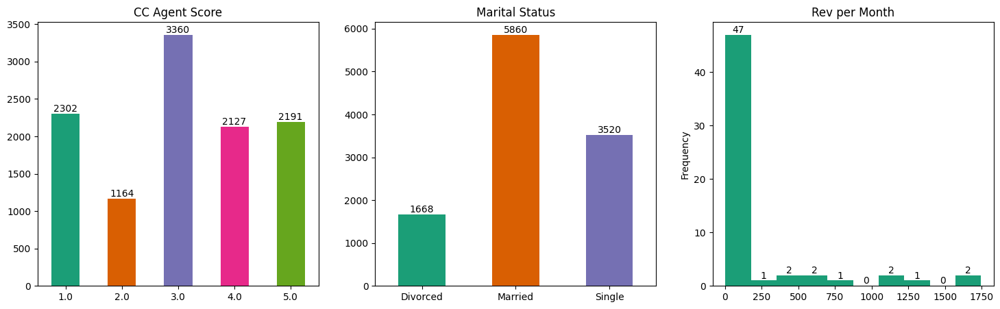

In [ ]:
# @title 4th Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - Most of the customers provided score as `3` for the `CC Agent`. <br>
# @markdown > Plot 2 - Most of the customers are under `married` and followed by `Single` users. <br>
# @markdown > Plot 3 - Most of the customers are under `Regular Plus` and `Super` Account Segment.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('CC_Agent_Score').size().plot(kind='bar', rot='horizontal',
                                                    title='CC Agent Score',
                                                    color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 2nd Column
plt.subplot(1, 3, 2)
ax = df.groupby('Marital_Status').size().plot(kind='bar', rot='horizontal',
                                                  title='Marital Status',
                                                  color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('rev_per_month').size().plot(kind='hist', rot='horizontal', title='Rev per Month',
                                      color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

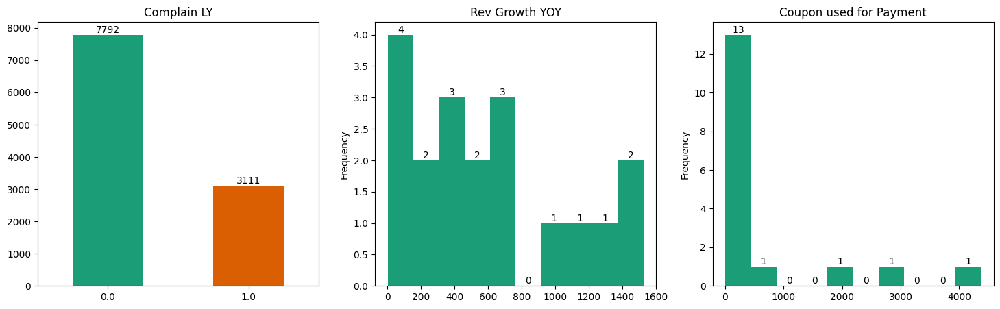

In [ ]:
# @title 5th Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - `Complain_ly` has less complains. <br>
# @markdown > Plot 2 - `Rev_growth_yoy` does seems like normal distribution. <br>
# @markdown > Plot 3 - Most of the customers used `Coupon for payment` between `0 and 500`.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('Complain_ly').size().plot(kind='bar', rot='horizontal',
                                                    title='Complain LY',
                                                    color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 2nd Column
plt.subplot(1, 3, 2)
ax = df.groupby('rev_growth_yoy').size().plot(kind='hist', rot='horizontal',
                                                  title='Rev Growth YOY',
                                                  color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('coupon_used_for_payment').size().plot(kind='hist', rot='horizontal',
                                                       title='Coupon used for Payment',
                                                       color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

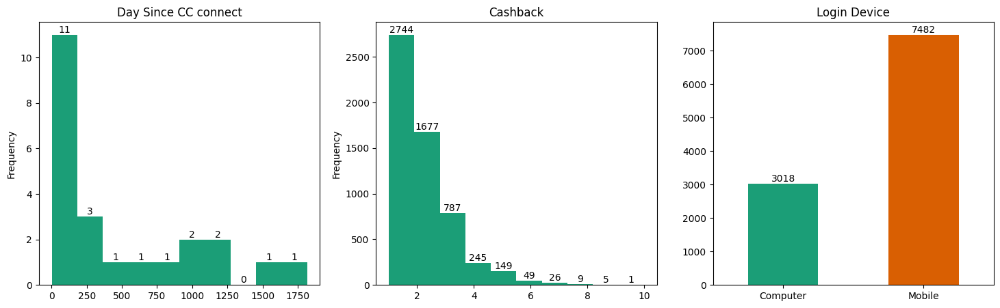

In [ ]:
# @title 6th Figure

# @markdown **Data Insights:**
# @markdown > Plot 1 - Most of the customers has not contacted `CC connect`. <br>
# @markdown > Plot 2 - Most of the customers got `Cashback` which is less in amount. <br>
# @markdown > Plot 3 - Most of the customers `Login Device` is `Mobile` compared to `Computer`.


fig = plt.figure(figsize=(18, 5))

# 1st Column
plt.subplot(1, 3, 1)
ax = df.groupby('Day_Since_CC_connect').size().plot(kind='hist', rot='horizontal',
                                                    title='Day Since CC connect',
                                                    color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 2nd Column
plt.subplot(1, 3, 2)
ax = df.groupby('cashback').size().plot(kind='hist', rot='horizontal',
                                                  title='Cashback',
                                                  color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);


# 3rd Column
plt.subplot(1, 3, 3)
ax = df.groupby('Login_device').size().plot(kind='bar', rot='horizontal',
                                                       title='Login Device',
                                                       color=sns.palettes.mpl_palette('Dark2'))
ax.set_xlabel('')
ax.bar_label(ax.containers[0]);

### Bivariate Analysis

In [ ]:
# @title Warning

import warnings

warnings.filterwarnings('ignore')

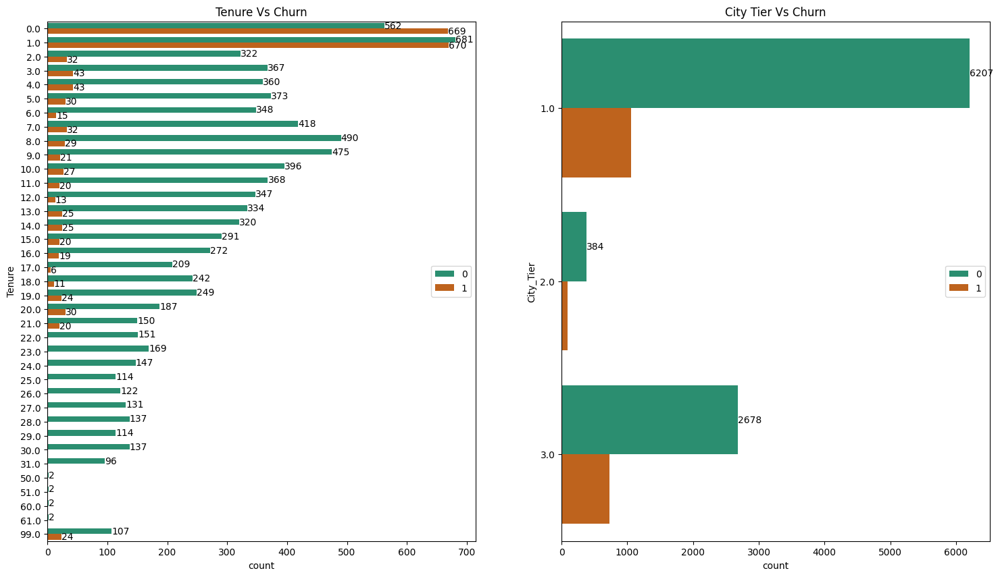

In [ ]:
# @title `Tenure` Vs `Churn` and `City Tier` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - If the `tenure` is less, the `Churn` is more. <br>
# @markdown > Plot 2 - `City_Tier` 2 and 3 has comparably more number of `Churn`rate.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='Tenure', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Tenure Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='City_Tier', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('City Tier Vs Churn')
ax.bar_label(ax.containers[0]);

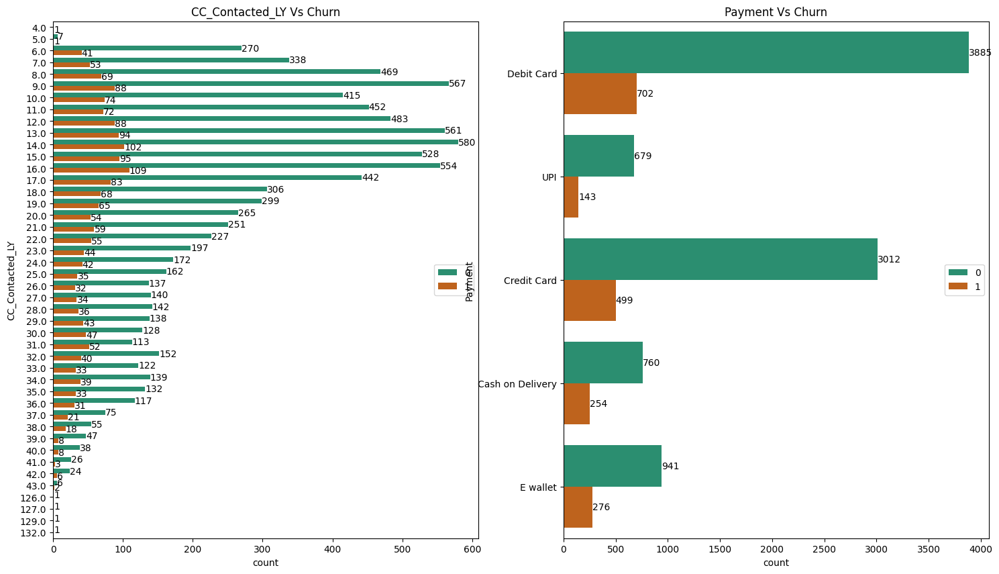

In [ ]:
# @title `CC_Contacted_LY` Vs `Churn` and `Payment` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - If the `CC_Contacted_LY` is more, the `Churn` is also more. <br>
# @markdown > Plot 2 - Except `Debit and Credit` card all other payment methods are having high `Churn` rate.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='CC_Contacted_LY', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('CC_Contacted_LY Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='Payment', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Payment Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

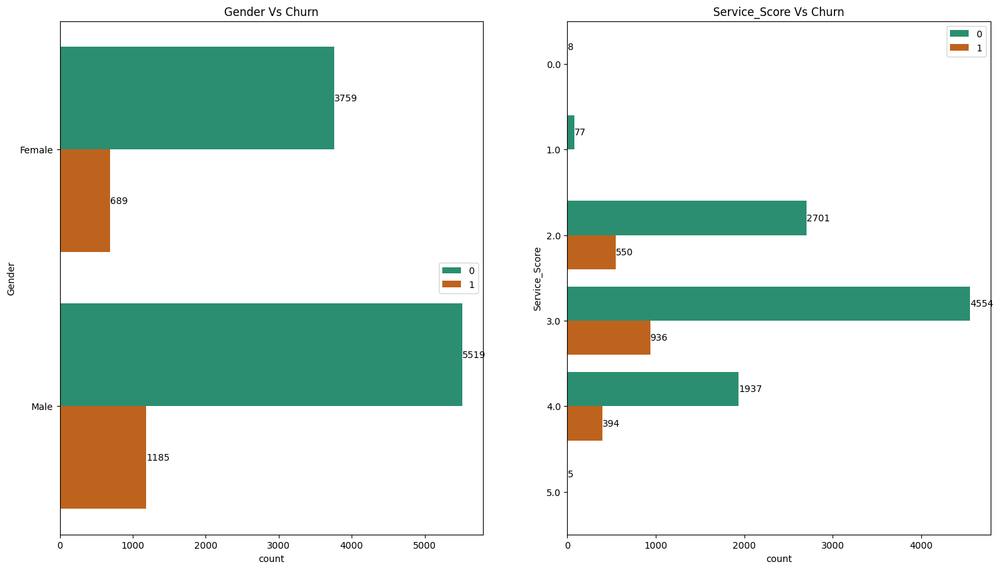

In [ ]:
# @title `Gender` Vs `Churn` and `Service_Score` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `Gender` doesn't show any dependency over `Churn`. <br>
# @markdown > Plot 2 - It seems like `Service_Score` has a positive relation with `Churn`.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='Gender', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Gender Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='Service_Score', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='upper right')
ax.set_title('Service_Score Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

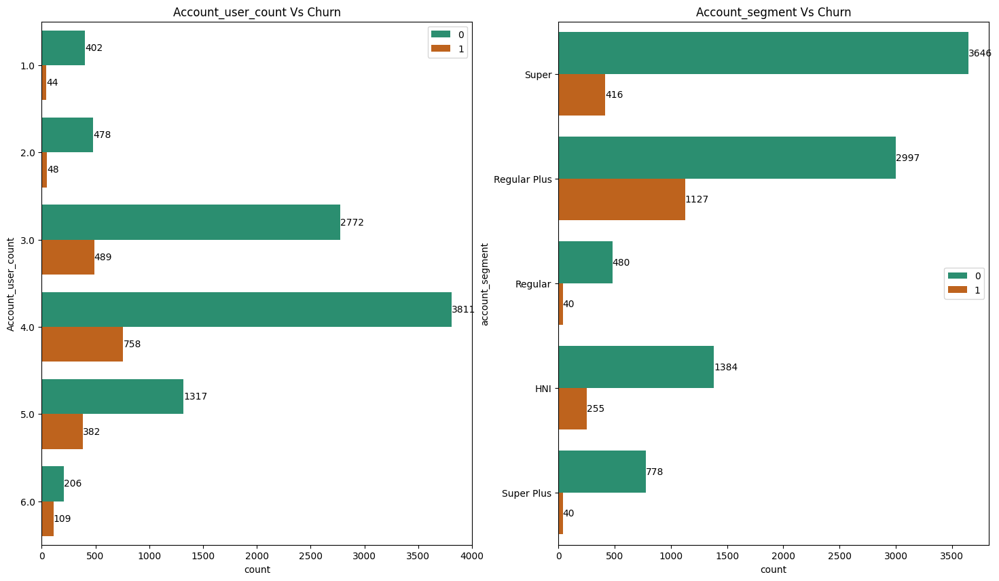

In [ ]:
# @title `Account_user_count` Vs `Churn` and `account_segment` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `Account_user_count` shows positive relation with `Churn` rate. <br>
# @markdown > Plot 2 - It seems like `Regular Plus` `Segment` user are more likely to `Churn`.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='Account_user_count', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='upper right')
ax.set_title('Account_user_count Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='account_segment', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Account_segment Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

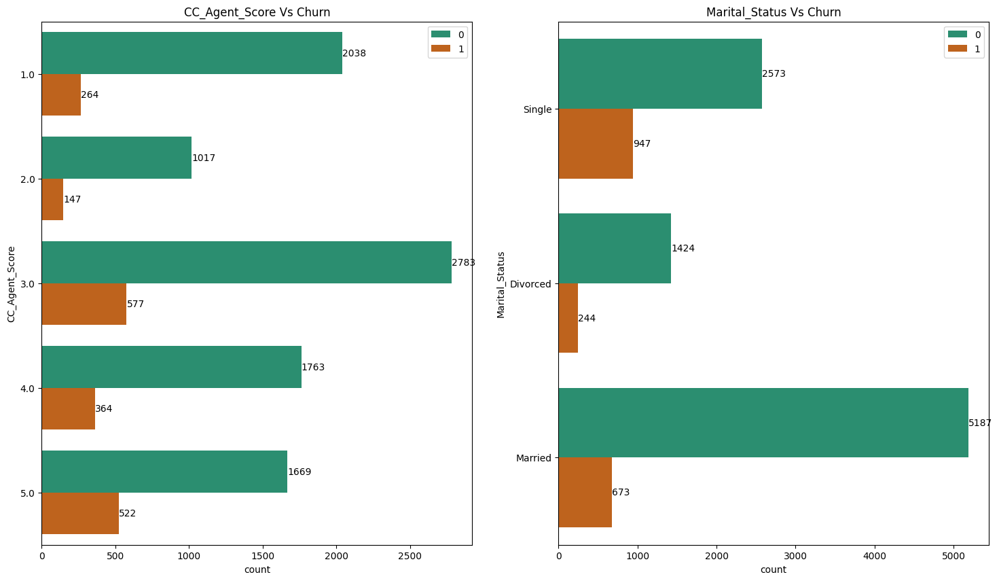

In [ ]:
# @title `CC_Agent_Score` Vs `Churn` and `Marital_Status` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `CC_Agent_Score` shows no relation with `Churn` rate. <br>
# @markdown > Plot 2 - It seems like `Single` `Marital_status` user are more likely to `Churn`.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='CC_Agent_Score', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='upper right')
ax.set_title('CC_Agent_Score Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='Marital_Status', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='upper right')
ax.set_title('Marital_Status Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

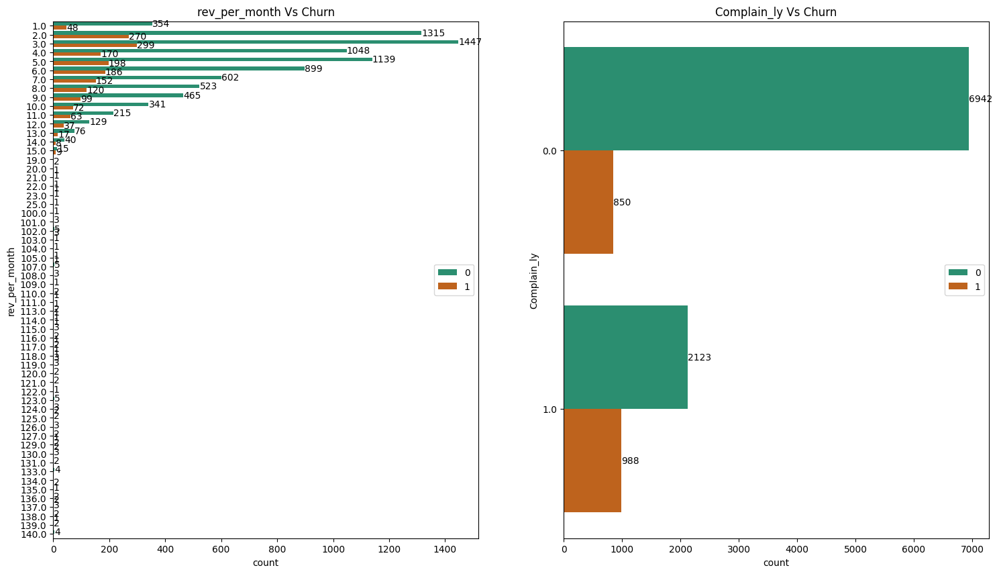

In [ ]:
# @title `rev_per_month` Vs `Churn` and `Complain_ly` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `rev_per_month` shows positive relation with `Churn` rate. <br>
# @markdown > Plot 2 - Positive `Complain_ly` has more likely to `Churn`.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='rev_per_month', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('rev_per_month Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='Complain_ly', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Complain_ly Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

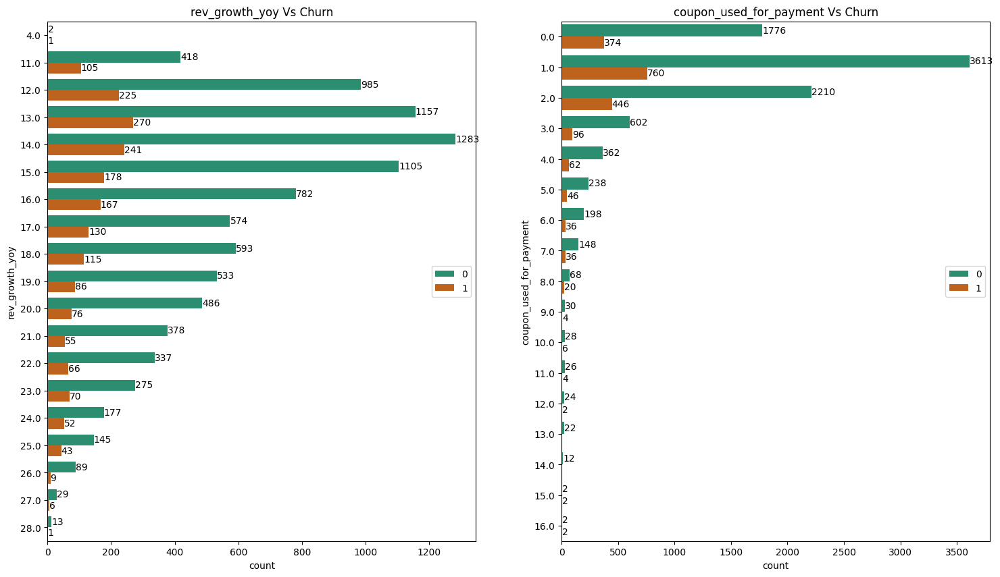

In [ ]:
# @title `rev_growth_yoy` Vs `Churn` and `coupon_used_for_payment` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `rev_growth_yoy` shows positive relation with `Churn` rate. <br>
# @markdown > Plot 2 - `coupon_used_for_payment` shows positive relation with `Churn` rate.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='rev_growth_yoy', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('rev_growth_yoy Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='coupon_used_for_payment', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('coupon_used_for_payment Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

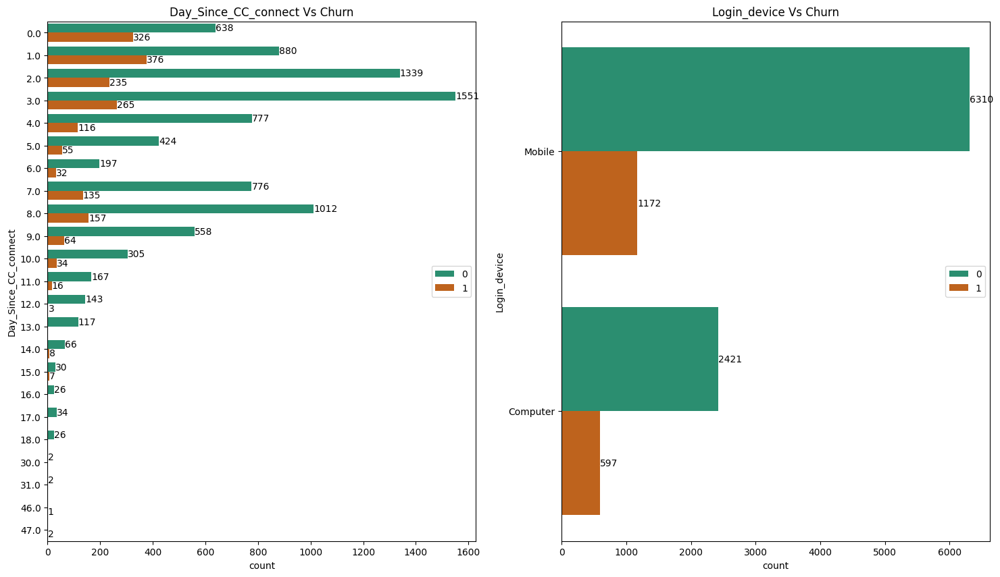

In [ ]:
# @title `Day_Since_CC_connect` Vs `Churn` and `Login_device` Vs `Churn`
# @markdown **Data Insights:**
# @markdown > Plot 1 - `Day_Since_CC_connect` shows positive relation with `Churn` rate. <br>
# @markdown > Plot 2 - `Login_device` shows not much of the relation with `Churn` rate.

fig = plt.figure(figsize=(18, 10))

plt.subplot(121)
ax = sns.countplot(df, y='Day_Since_CC_connect', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Day_Since_CC_connect Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

plt.subplot(122)
ax = sns.countplot(df, y='Login_device', hue='Churn', palette=sns.palettes.mpl_palette('Dark2'))
ax.legend(loc='center right')
ax.set_title('Login_device Vs Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1]);

### Multivariate Analysis

#### Pair plot of the dataset

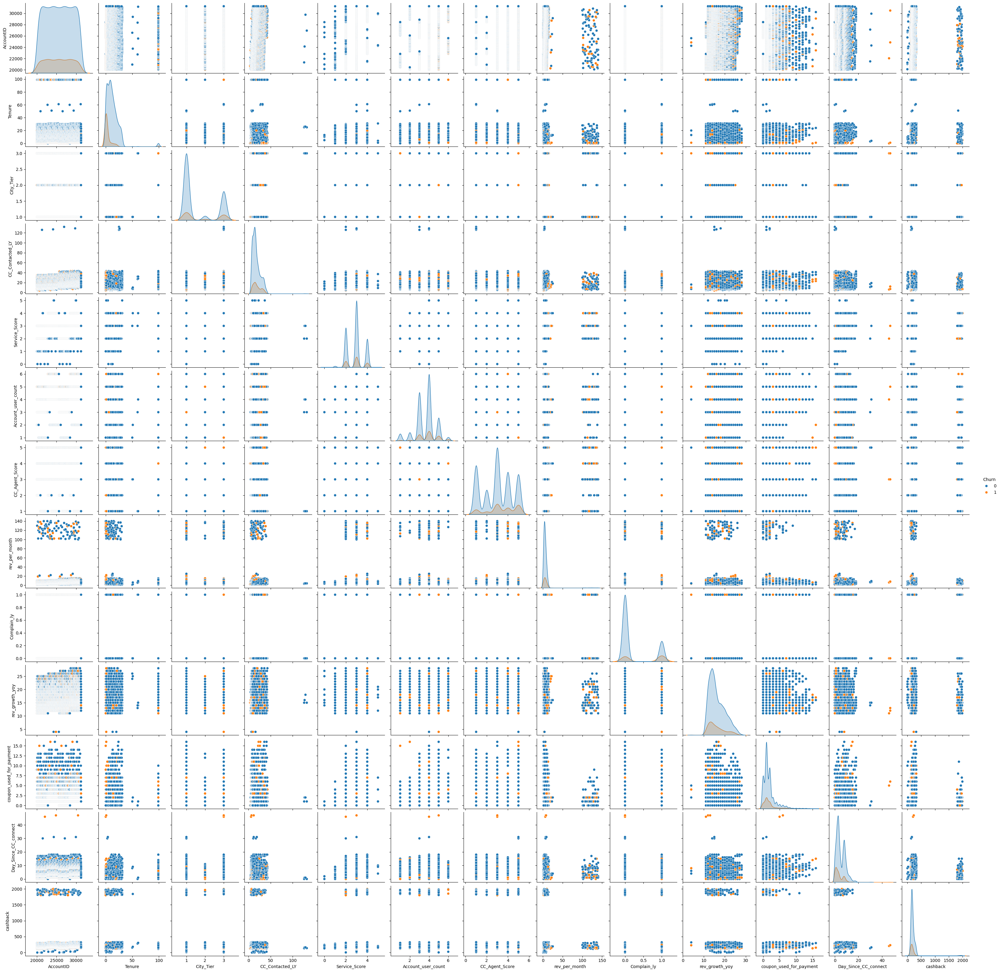

In [ ]:
sns.pairplot(df, hue='Churn', diag_kind='kde');

> **Data Insights:**

The pair-plot shown above indicated that the independent variable are week or poor predictors of target variable as we the density of independent variable overlaps with the density of target variable.

### Correlation Matrix

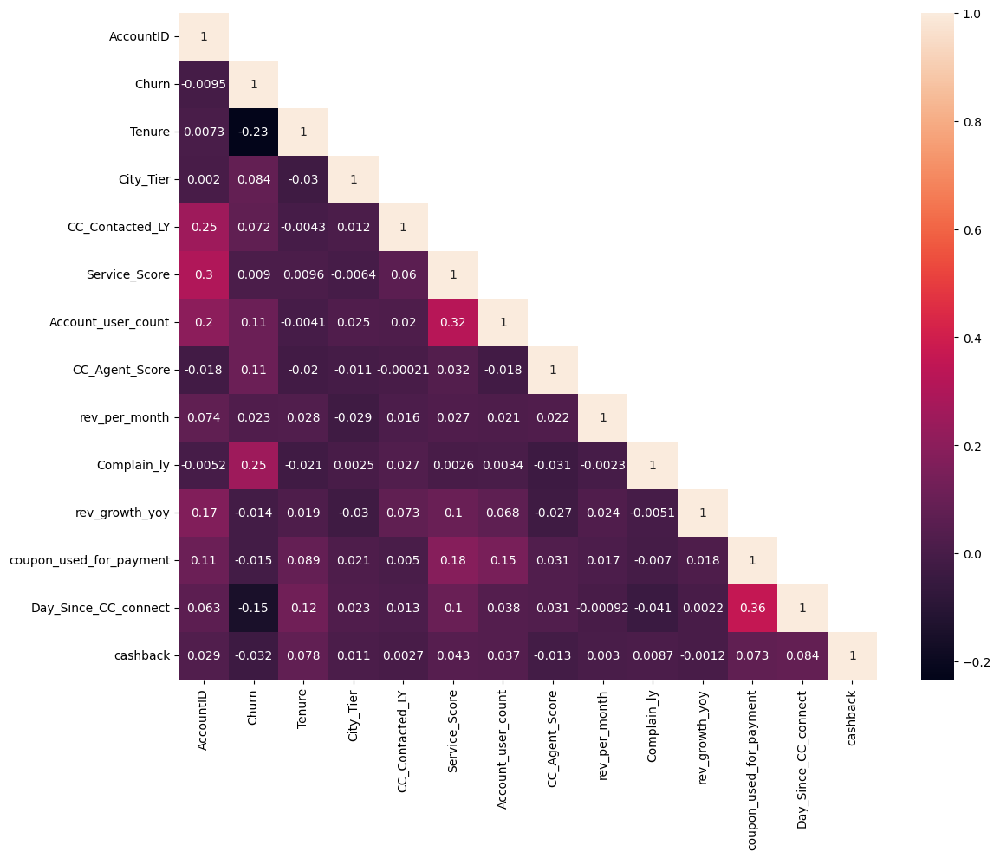

In [ ]:
cor = df.select_dtypes(exclude='O').corr()
mask = np.triu(cor, +1)
fig,ax= plt.subplots(figsize=(13, 10))
sns.heatmap(cor, mask=mask, annot=True, fmt='.2g');

> **Data Insights:**

The Data doesn't shows much of the correlation with each other except few columns (i.e., `Day_Since_CC_connect` with `coupon_used_for_payment`, `Account_user_count` with `Service_Score` and negative correlation with `Tenure` and `Churn` along with `Day_Since_CC_connect`.

### Removing Unwanted column

In [ ]:
df = df.drop('AccountID', axis=1)

df.head()

### Handling missing values

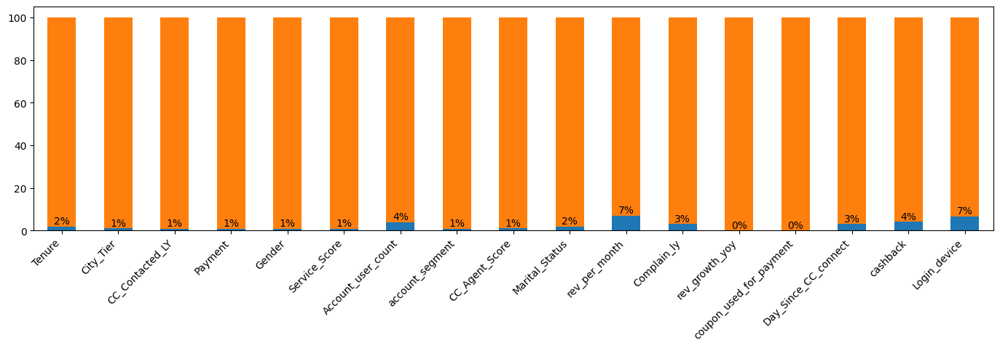

In [ ]:
# @title Before Treatment

missing_per = (df.isnull().sum()[df.isnull().sum() > 0] / len(df)) * 100

miss_df = pd.DataFrame({
    'Col Name': missing_per.index,
    'Missing %': missing_per,
    'Non-Missing %': 100 - missing_per,
})

fig, ax = plt.subplots(figsize=(17, 4))

miss_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xticklabels(miss_df['Col Name'].values, rotation=45, ha='right')
ax.get_legend().remove()
ax.bar_label(ax.containers[0], fmt='%.0f%%');

In [ ]:
# @title After Treatment

# @markdown > * Out of 19 variables we have null values in 17 variables.
# @markdown > * Using "Median" to impute null values where variable is continuous in nature because Median is less prone to outliers when compared with mean.
# @markdown > * Using "Mode: to impute null values where variables are categorical in nature. We have treated null values variable by variable as each and every variable is unique in its nature.


for column in df.select_dtypes(exclude='O'):
    df[column].fillna(df[column].median(), inplace=True)


for column in df.select_dtypes(include='O'):
    df[column].fillna(df['Gender'].mode()[0], inplace=True)


df.isnull().sum()

Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

### Checking for Outliers on continous variables

In [ ]:
#treating outlier
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

#### Before and After Treatment

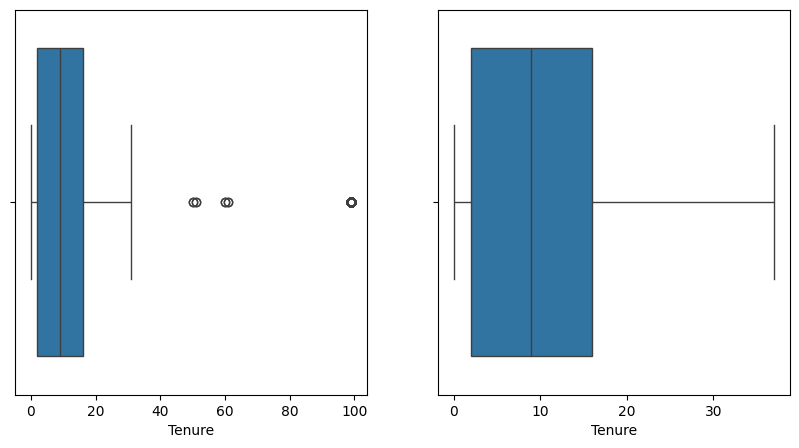

In [ ]:
# @title Tenure

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['Tenure'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['Tenure'])
df['Tenure']=np.where(df['Tenure']>up,up,df['Tenure'])
df['Tenure']=np.where(df['Tenure']<lw,lw,df['Tenure'])

sns.boxplot(df['Tenure'], orient='h', ax=ax[1]);

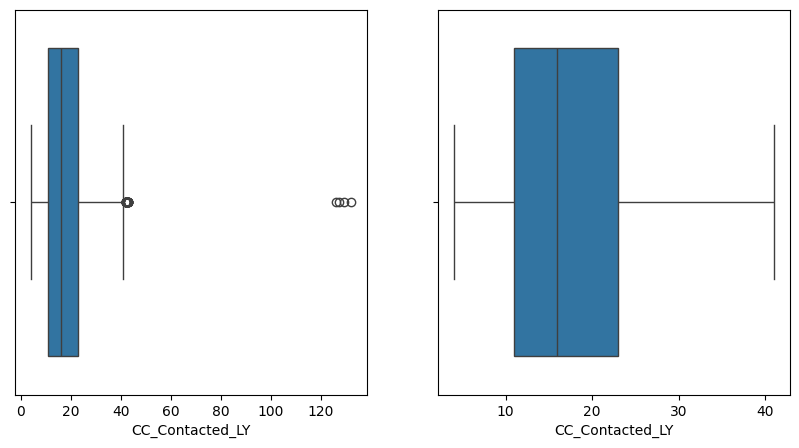

In [ ]:
# @title CC_Contacted_LY

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['CC_Contacted_LY'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['CC_Contacted_LY'])
df['CC_Contacted_LY']=np.where(df['CC_Contacted_LY']>up,up,df['CC_Contacted_LY'])
df['CC_Contacted_LY']=np.where(df['CC_Contacted_LY']<lw,lw,df['CC_Contacted_LY'])

sns.boxplot(df['CC_Contacted_LY'], orient='h', ax=ax[1]);

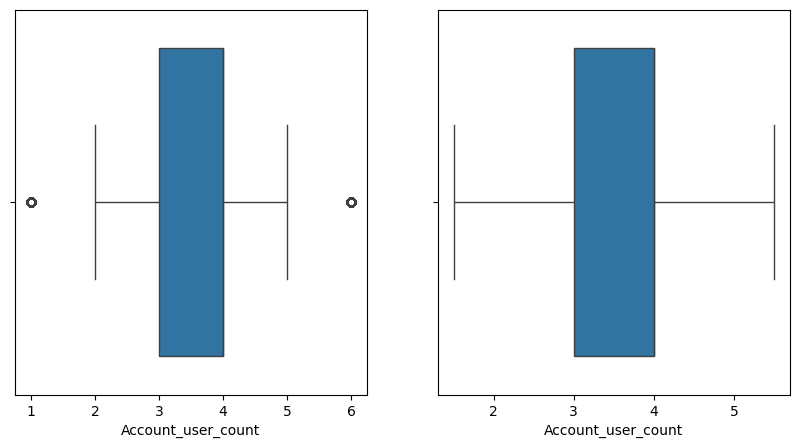

In [ ]:
# @title Account_user_count

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['Account_user_count'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['Account_user_count'])
df['Account_user_count']=np.where(df['Account_user_count']>up,up,df['Account_user_count'])
df['Account_user_count']=np.where(df['Account_user_count']<lw,lw,df['Account_user_count'])

sns.boxplot(df['Account_user_count'], orient='h', ax=ax[1]);

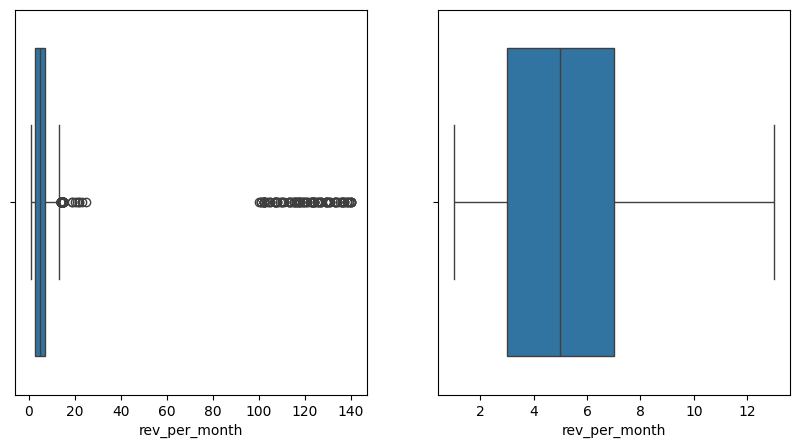

In [ ]:
# @title rev_per_month

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['rev_per_month'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['rev_per_month'])
df['rev_per_month']=np.where(df['rev_per_month']>up,up,df['rev_per_month'])
df['rev_per_month']=np.where(df['rev_per_month']<lw,lw,df['rev_per_month'])

sns.boxplot(df['rev_per_month'], orient='h', ax=ax[1]);

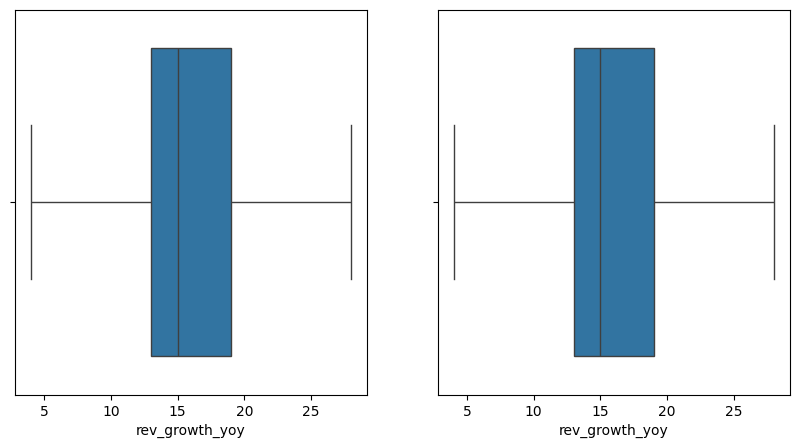

In [ ]:
# @title rev_growth_yoy

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['rev_growth_yoy'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['rev_growth_yoy'])
df['rev_growth_yoy']=np.where(df['rev_growth_yoy']>up,up,df['rev_growth_yoy'])
df['rev_growth_yoy']=np.where(df['rev_growth_yoy']<lw,lw,df['rev_growth_yoy'])

sns.boxplot(df['rev_growth_yoy'], orient='h', ax=ax[1]);

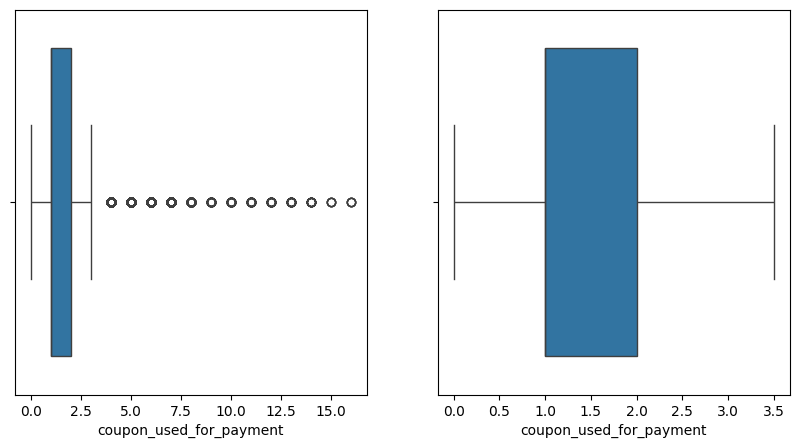

In [ ]:
# @title coupon_used_for_payment

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['coupon_used_for_payment'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['coupon_used_for_payment'])
df['coupon_used_for_payment']=np.where(df['coupon_used_for_payment']>up,up,df['coupon_used_for_payment'])
df['coupon_used_for_payment']=np.where(df['coupon_used_for_payment']<lw,lw,df['coupon_used_for_payment'])

sns.boxplot(df['coupon_used_for_payment'], orient='h', ax=ax[1]);

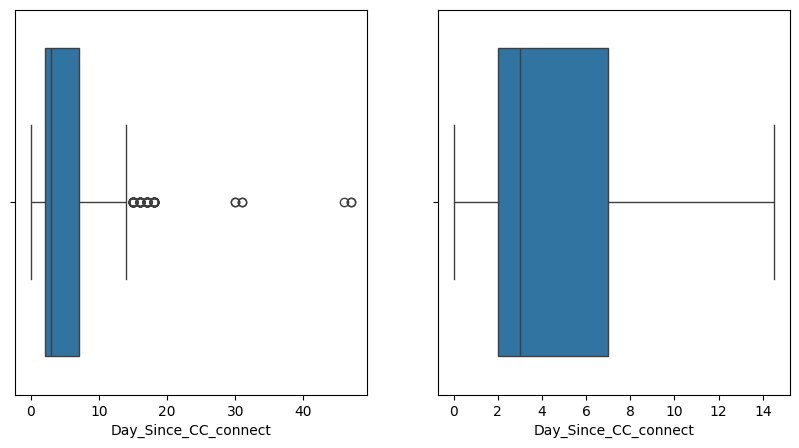

In [ ]:
# @title Day_Since_CC_connect

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['Day_Since_CC_connect'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['Day_Since_CC_connect'])
df['Day_Since_CC_connect']=np.where(df['Day_Since_CC_connect']>up,up,df['Day_Since_CC_connect'])
df['Day_Since_CC_connect']=np.where(df['Day_Since_CC_connect']<lw,lw,df['Day_Since_CC_connect'])

sns.boxplot(df['Day_Since_CC_connect'], orient='h', ax=ax[1]);

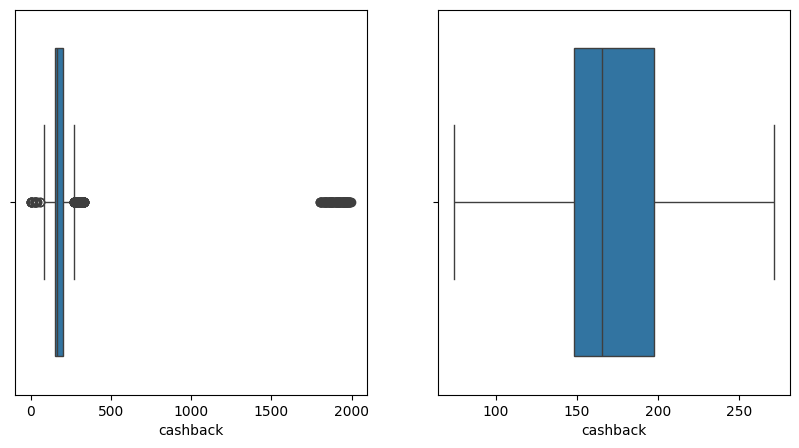

In [ ]:
# @title cashback

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(df['cashback'], orient='h', ax=ax[0])

lw,up=remove_outlier(df['cashback'])
df['cashback']=np.where(df['cashback']>up,up,df['cashback'])
df['cashback']=np.where(df['cashback']<lw,lw,df['cashback'])

sns.boxplot(df['cashback'], orient='h', ax=ax[1]);

## Data Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from imblearn.combine import SMOTEENN
from sklearn.cluster import KMeans

Splitting the Dataset

In [ ]:
X = df.drop('Churn', axis=1)
y = df[['Churn']]

> Dividing the dataset into X and y. Where X containing independent variables and y containing dependent variable.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=8)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((9008, 17), (2252, 17), (9008, 1), (2252, 1))

> Splitting the dataset into `80%` of train and `20%` of test dataset.

### Encoding the categorical variables using `LabelEncoder`

In [ ]:
obj_cols = X_train.select_dtypes('object').columns

for col in X_train.columns:
    if col in obj_cols:
        encoder = LabelEncoder()
        encoder.fit(X_train[col])
        X_train[col] = encoder.transform(X_train[col])
        X_test[col] = encoder.transform(X_test[col])


X_train.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
6848,2.0,1.0,18.0,2,1,2.0,3.0,3,5.0,3,4.0,0.0,16.0,0.0,2.0,122.62,2
8131,13.0,1.0,23.0,2,0,3.0,4.0,0,3.0,2,4.0,0.0,15.0,3.5,12.0,208.35,2
8139,13.0,1.0,29.0,2,0,2.0,3.0,0,1.0,3,8.0,1.0,16.0,3.0,3.0,181.45,2
9984,19.0,1.0,14.0,1,1,4.0,5.0,5,1.0,2,12.0,0.0,26.0,2.0,9.0,271.44,0
7701,4.0,1.0,8.0,2,0,3.0,3.0,4,5.0,2,6.0,0.0,13.0,1.0,3.0,148.48,0


> Selecting all the columns which are of `object` type such as (`Payment`, `Gender`, `Marital_Status`, etc.,) and converting into numerical data using `LabelEncoder` from `scikit-learn` library.

### Scaling the data using `MinMaxScaler`

In [ ]:
scaling = MinMaxScaler()
scaling.fit(X_train)
X_train = pd.DataFrame(scaling.transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(scaling.transform(X_test), columns=X_test.columns, index=X_test.index)

In [ ]:
X_train.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
6848,0.054054,0.0,0.378378,0.4,1.0,0.4,0.375,0.6,1.0,1.000000,0.250000,0.0,0.500000,0.000000,0.137931,0.247167,1.0
8131,0.351351,0.0,0.513514,0.4,0.0,0.6,0.625,0.0,0.5,0.666667,0.250000,0.0,0.458333,1.000000,0.827586,0.680848,1.0
8139,0.351351,0.0,0.675676,0.4,0.0,0.4,0.375,0.0,0.0,1.000000,0.583333,1.0,0.500000,0.857143,0.206897,0.544769,1.0
9984,0.513514,0.0,0.270270,0.2,1.0,0.8,0.875,1.0,0.0,0.666667,0.916667,0.0,0.916667,0.571429,0.620690,1.000000,0.0
7701,0.108108,0.0,0.108108,0.4,0.0,0.6,0.375,0.8,1.0,0.666667,0.416667,0.0,0.375000,0.285714,0.206897,0.377985,0.0


> **Data Insights**

Since the data doesn't follow uniform distribution or bell curve shape, we need to use normalization instead of standardization for better results.

### Data balancing using `SMOTE`

> Since, the data is imbalanced we need to try to balance the `Churn`.

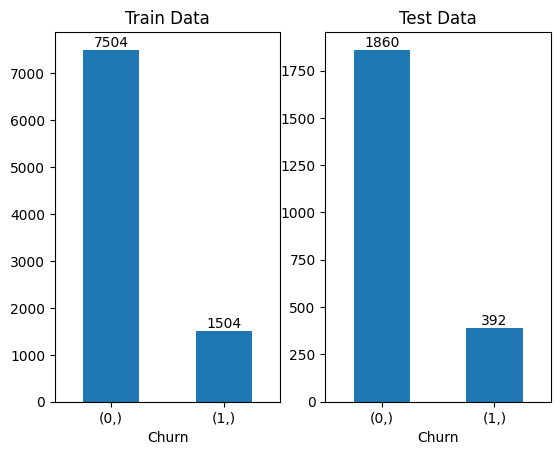

In [ ]:
# @title Before sampling

plt.subplot(121)
ax = y_train.value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Train Data')

plt.subplot(122)
ax = y_test.value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Test Data');

In [ ]:
sm = SMOTEENN(random_state=8)
sm.fit(X_train, y_train)
X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)
X_test_sm, y_test_sm = sm.fit_resample(X_test, y_test)

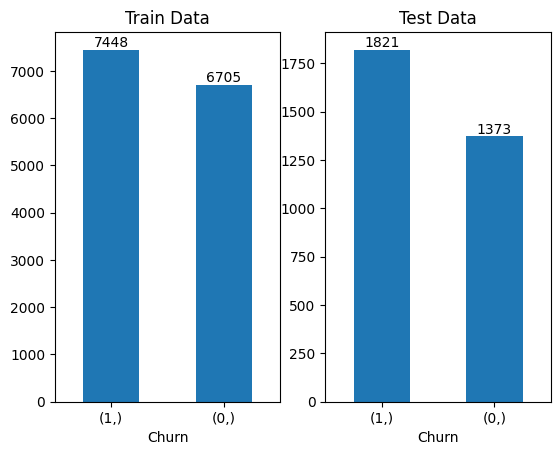

In [ ]:
# @title After Sampling

plt.subplot(121)
ax = y_train_sm.value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Train Data')

plt.subplot(122)
ax = y_test_sm.value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Test Data');

### Clustering using k-means

In [ ]:
interia = []

for i in range(1, 20):
    k_means = KMeans(n_clusters=i, n_init='auto')
    k_means.fit(X_train_sm)
    inter = k_means.inertia_
    interia.append(inter)

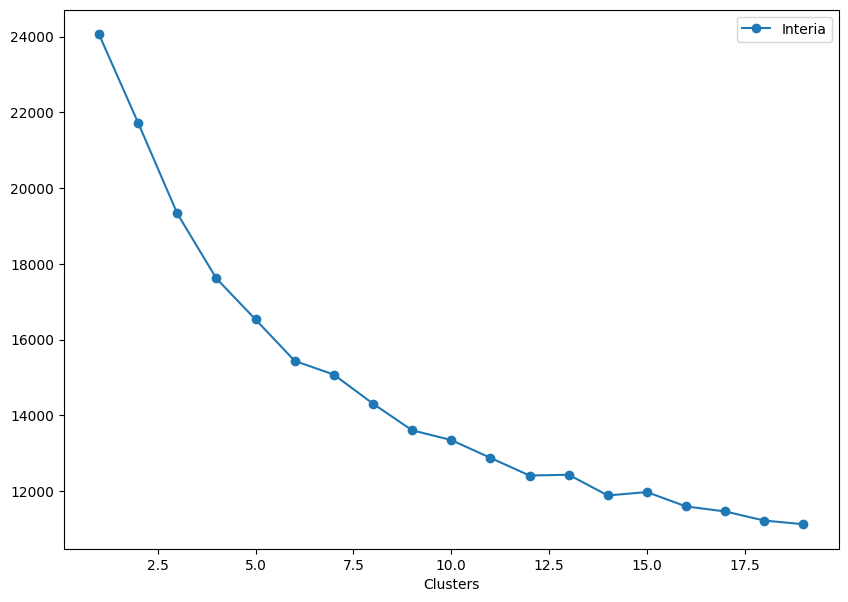

In [ ]:
cluster = pd.DataFrame({
    'Clusters': list(range(1, 20)),
    'Interia': interia

})

cluster.plot(x='Clusters', y='Interia', marker='o', figsize=(10, 7));

In [ ]:
k_means = KMeans(n_clusters=7, random_state=8, n_init='auto')
k_means.fit(X_train_sm)
train_labels = k_means.predict(X_train_sm)
train_labels

array([2, 0, 5, ..., 4, 4, 6], dtype=int32)

In [ ]:
test_labels = k_means.predict(X_test_sm)
test_labels[:10]

array([3, 1, 4, 3, 4, 3, 4, 3, 2, 1], dtype=int32)

In [ ]:
X_train_means = X_train_sm.copy()
X_train_means['Clusters'] = train_labels

X_test_means = X_test_sm.copy()
X_test_means['Clusters'] = test_labels

In [ ]:
X_train_final = X_train_means.copy()
X_test_final = X_test_means.copy()

y_train_final = y_train_sm.copy()
y_test_final = y_test_sm.copy()

In [ ]:
X_train_final.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
0,0.351351,0.0,0.513514,0.4,0.0,0.6,0.625,0.0,0.5,0.666667,0.250000,0.0,0.458333,1.000000,0.827586,0.680848,1.0,2
1,0.351351,0.0,0.675676,0.4,0.0,0.4,0.375,0.0,0.0,1.000000,0.583333,1.0,0.500000,0.857143,0.206897,0.544769,1.0,0
2,0.513514,0.0,0.270270,0.2,1.0,0.8,0.875,1.0,0.0,0.666667,0.916667,0.0,0.916667,0.571429,0.620690,1.000000,0.0,5
3,0.108108,0.0,0.108108,0.4,0.0,0.6,0.375,0.8,1.0,0.666667,0.416667,0.0,0.375000,0.285714,0.206897,0.377985,0.0,2
4,0.216216,0.0,0.243243,0.4,1.0,0.4,0.375,0.8,0.5,1.000000,0.416667,1.0,0.291667,0.285714,0.068966,0.383094,0.0,5


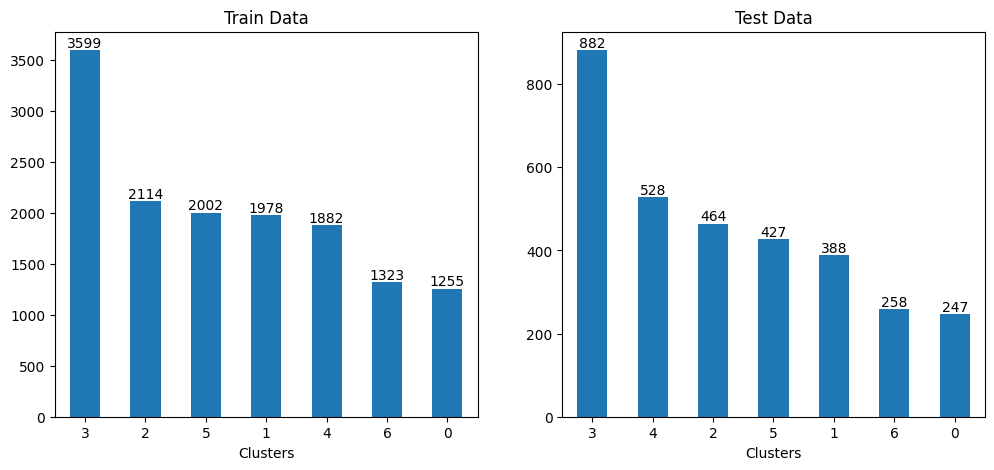

In [ ]:
fig = plt.figure(figsize=(12, 5))

plt.subplot(121)
ax = X_train_final['Clusters'].value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Train Data')

plt.subplot(122)
ax = X_test_final['Clusters'].value_counts().plot(kind='bar', rot='horizontal')
ax.bar_label(ax.containers[0])
ax.set_title('Test Data');

## Training the model

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (GradientBoostingClassifier,
                              HistGradientBoostingClassifier,
                              RandomForestClassifier,
                              AdaBoostClassifier,
                              BaggingClassifier,
                              StackingClassifier)
from xgboost import XGBClassifier


from sklearn.model_selection import cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_curve, RocCurveDisplay, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

In [ ]:
models = {
    'LogisticRegression': LogisticRegression(random_state=8),
    'DecisionTree': DecisionTreeClassifier(random_state=8),
    'SVC': SVC(random_state=8),
    'GradientBoosting': GradientBoostingClassifier(random_state=8),
    'HistGradientBoosting': HistGradientBoostingClassifier(random_state=8),
    'KNN': KNeighborsClassifier(n_neighbors=2),
    'RandomForest': RandomForestClassifier(random_state=8),
    'AdaBoost': AdaBoostClassifier(random_state=8),
    'Bagging': BaggingClassifier(random_state=8),
    'XGB': XGBClassifier(),
}

In [ ]:
# Calculates the accuracy, precision, recall, and f1-score score
def calculate_results(name, y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision, recall, fscore, _ = precision_recall_fscore_support(y_true,
                                                                   y_pred,
                                                                   average='weighted')
    return {
        'Model Name': name,
        'Accuracy score': accuracy,
        'Precision score': precision,
        'Recall score': recall,
        'F1 score': fscore,
    }

In [ ]:
train_results = []
test_results = []

for name, model in models.items():
    result = cross_val_score(model, X=X_train_final, y=y_train_final, scoring='f1', cv=StratifiedKFold())
    train_results.append(np.mean(result))

    model.fit(X_train_final, y_train_final)
    y_pred = model.predict(X_test_final)

    test_results.append(calculate_results(name, y_test_final, y_pred))

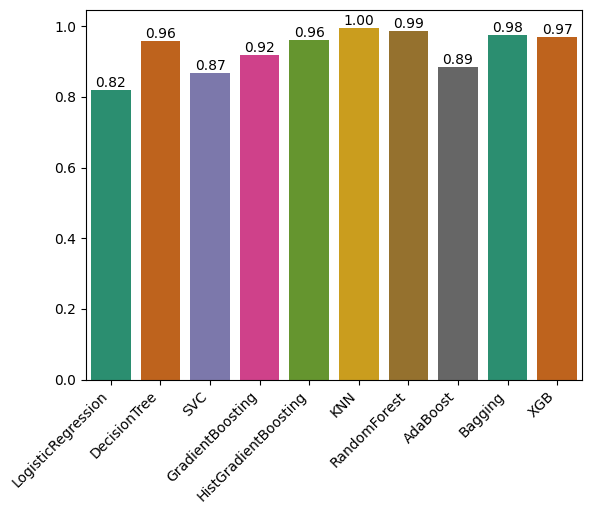

In [ ]:
# @title Train data score

ax = sns.barplot(x=list(models.keys()), y=train_results, palette='Dark2')
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')
ax.set_xticklabels(list(models.keys()), rotation=45, ha='right');

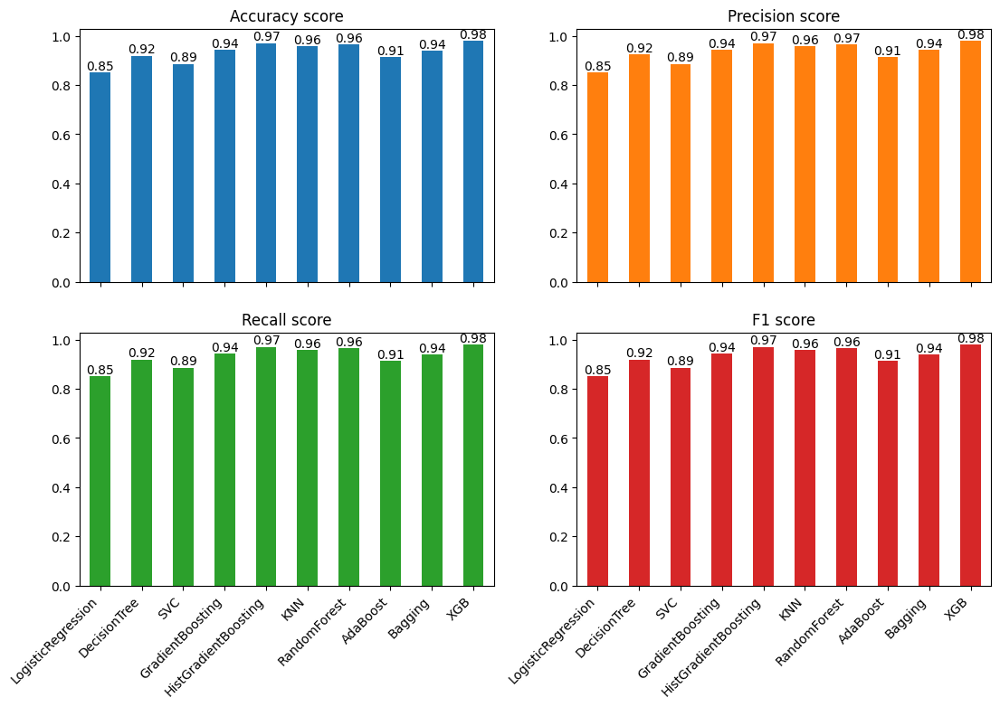

In [ ]:
# @title Test data score

axis = pd.DataFrame(test_results).plot(kind='bar', subplots=True, figsize=(13, 8), layout=(2, 2))
for ax in axis.flatten():
    ax.get_legend().remove()
    ax.set_xticklabels(list(models.keys()), rotation=45, ha='right')
    ax.bar_label(ax.containers[0], fmt='%.2f');

**About Data:**
> <u>Best Models:</u>
* $DecisionTree$
* $GradientBoosting$
* $HistGradientBoosting$
* $KNN$
* $RandomForest$
* $Bagging$
* $XGB$

In [ ]:
best_models = ['DecisionTree', 'GradientBoosting', 'HistGradientBoosting', 'KNN', 'RandomForest', 'Bagging', 'XGB']
best_models_tuned = ['DecisionTreeTuned', 'GradientBoostingTuned', 'HistGradientBoostingTuned', 'KNNTuned', 'RandomForestTuned', 'XGBTuned']

In [ ]:
train_results, test_results  = [], []

In [ ]:
def pre_result_calculator(name, model):
    train_pred = model.predict(X_train_final)
    test_pred = model.predict(X_test_final)

    train_score = calculate_results(name, y_train_final, train_pred)
    test_score = calculate_results(name, y_test_final, test_pred)

    train_results.append(train_score)
    test_results.append(test_score)

    return (y_train_final, train_pred), \
     (y_test_final, test_pred), \
     pd.DataFrame(train_score, index=[0]), \
     pd.DataFrame(test_score, index=[0])

In [ ]:
def plot(train, test):
    fig, ax = plt.subplots(2, 2, figsize=(12, 12))
    fig.set_tight_layout({'pad': 5.0,
                          'w_pad': 5.0,
                          'h_pad': 5.0})
    ax = ax.flatten()

    ConfusionMatrixDisplay.from_predictions(train[0], train[1], cmap=plt.cm.Blues, ax=ax[0])
    ax[0].set_title('Train Confusion Matrix')
    RocCurveDisplay.from_predictions(train[0], train[1], ax=ax[1])
    ax[1].set_title('Train Roc Curve')

    ConfusionMatrixDisplay.from_predictions(test[0], test[1], cmap=plt.cm.Blues, ax=ax[2])
    ax[2].set_title('Test Confusion Matrix')
    RocCurveDisplay.from_predictions(test[0], test[1], ax=ax[3])
    ax[3].set_title('Test Roc Curve')

### Model 0 - DecisionTree

     Model Name  Accuracy score  Precision score  Recall score  F1 score
0  DecisionTree             1.0              1.0           1.0       1.0
     Model Name  Accuracy score  Precision score  Recall score  F1 score
0  DecisionTree         0.91891         0.924086       0.91891  0.919277


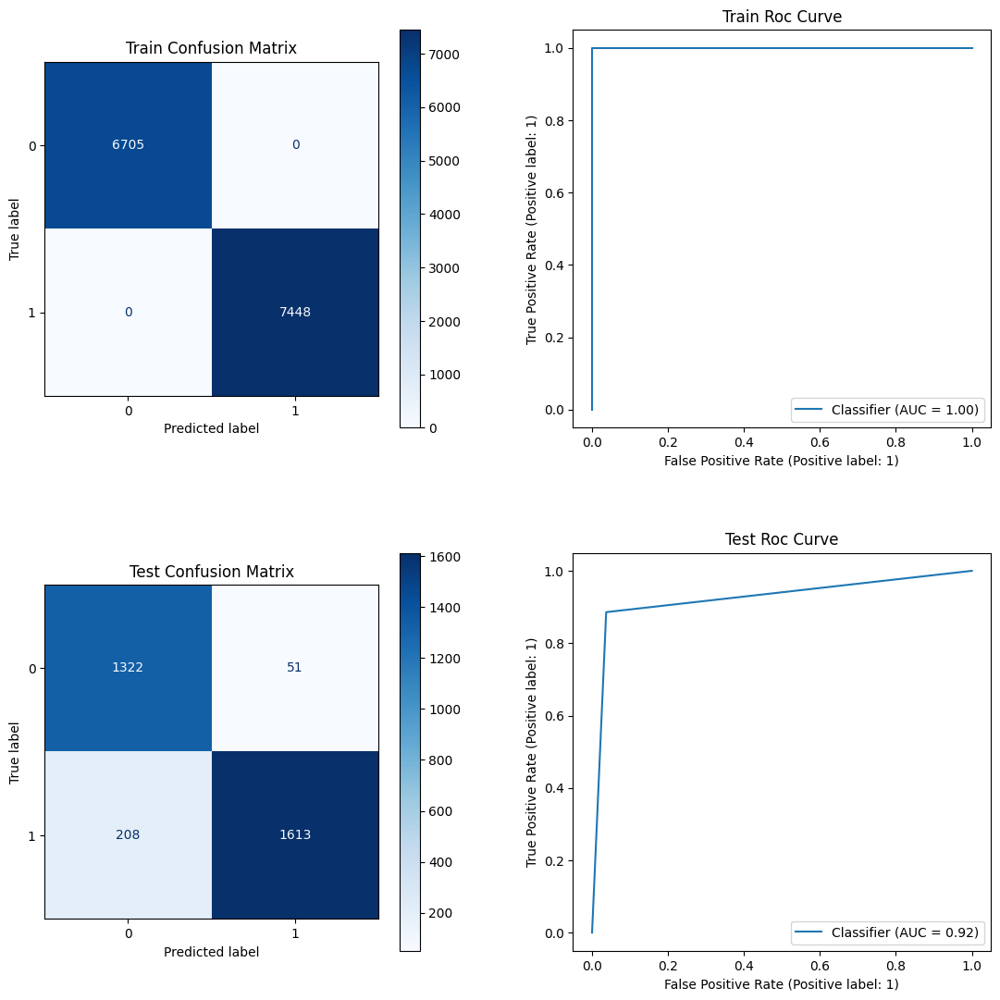

In [ ]:
dt = DecisionTreeClassifier(random_state=8)
dt.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[0], dt)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 1 - GradientBoosting

         Model Name  Accuracy score  Precision score  Recall score  F1 score
0  GradientBoosting        0.933018         0.933192      0.933018  0.933042
         Model Name  Accuracy score  Precision score  Recall score  F1 score
0  GradientBoosting        0.943331          0.94414      0.943331  0.943453


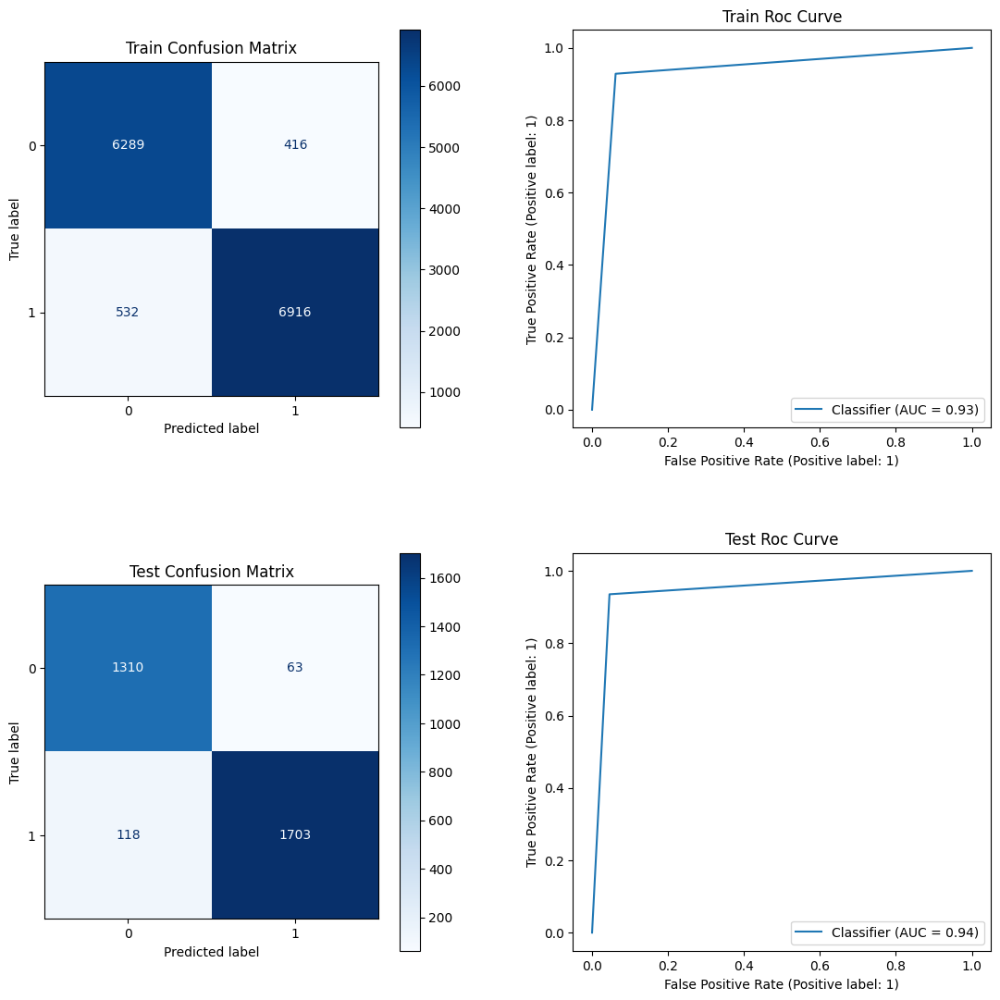

In [ ]:
gb = GradientBoostingClassifier(random_state=8)
gb.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[1], gb)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 2 - HistGradientBoosting

             Model Name  Accuracy score  Precision score  Recall score  \
0  HistGradientBoosting        0.989967         0.989967      0.989967   

   F1 score  
0  0.989967  
             Model Name  Accuracy score  Precision score  Recall score  \
0  HistGradientBoosting        0.970883          0.97109      0.970883   

   F1 score  
0  0.970916  


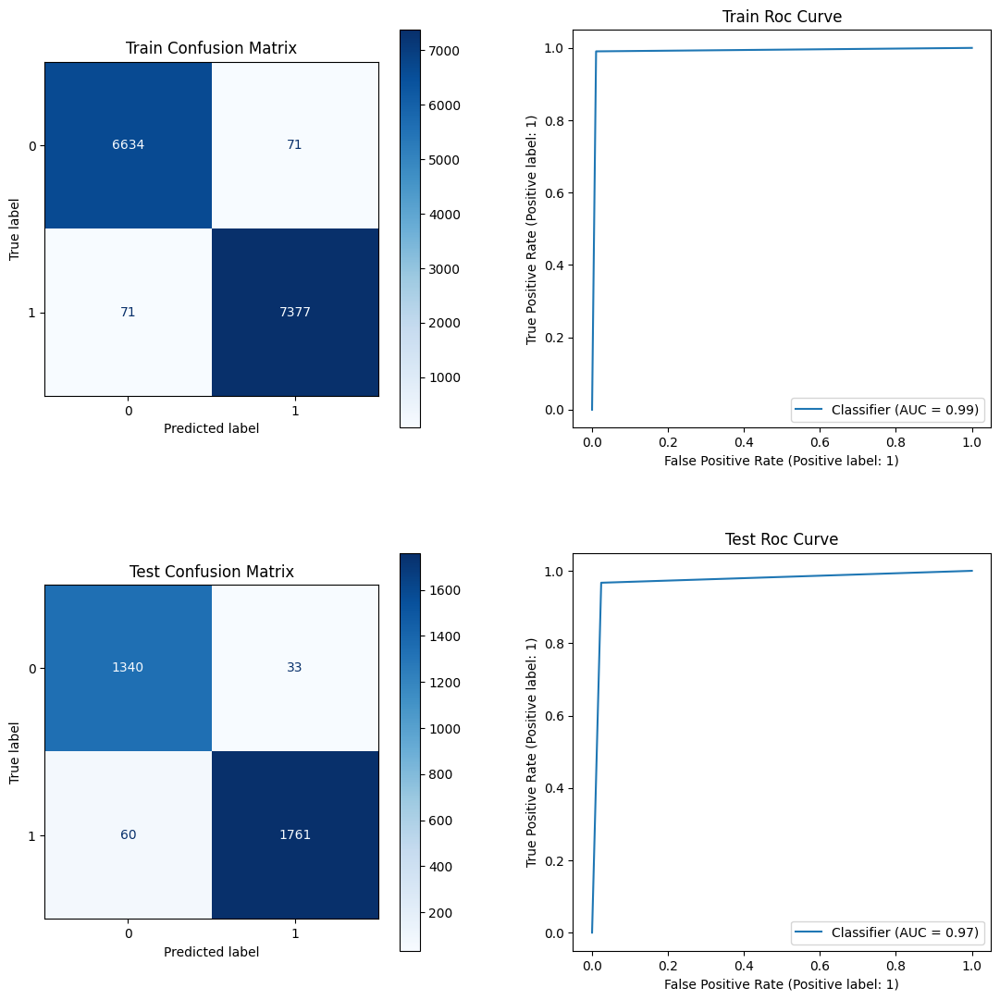

In [ ]:
hgb = HistGradientBoostingClassifier(random_state=8)
hgb.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[2], hgb)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 3 - KNN

  Model Name  Accuracy score  Precision score  Recall score  F1 score
0        KNN        0.999929         0.999929      0.999929  0.999929
  Model Name  Accuracy score  Precision score  Recall score  F1 score
0        KNN        0.956481         0.957105      0.956481  0.956566


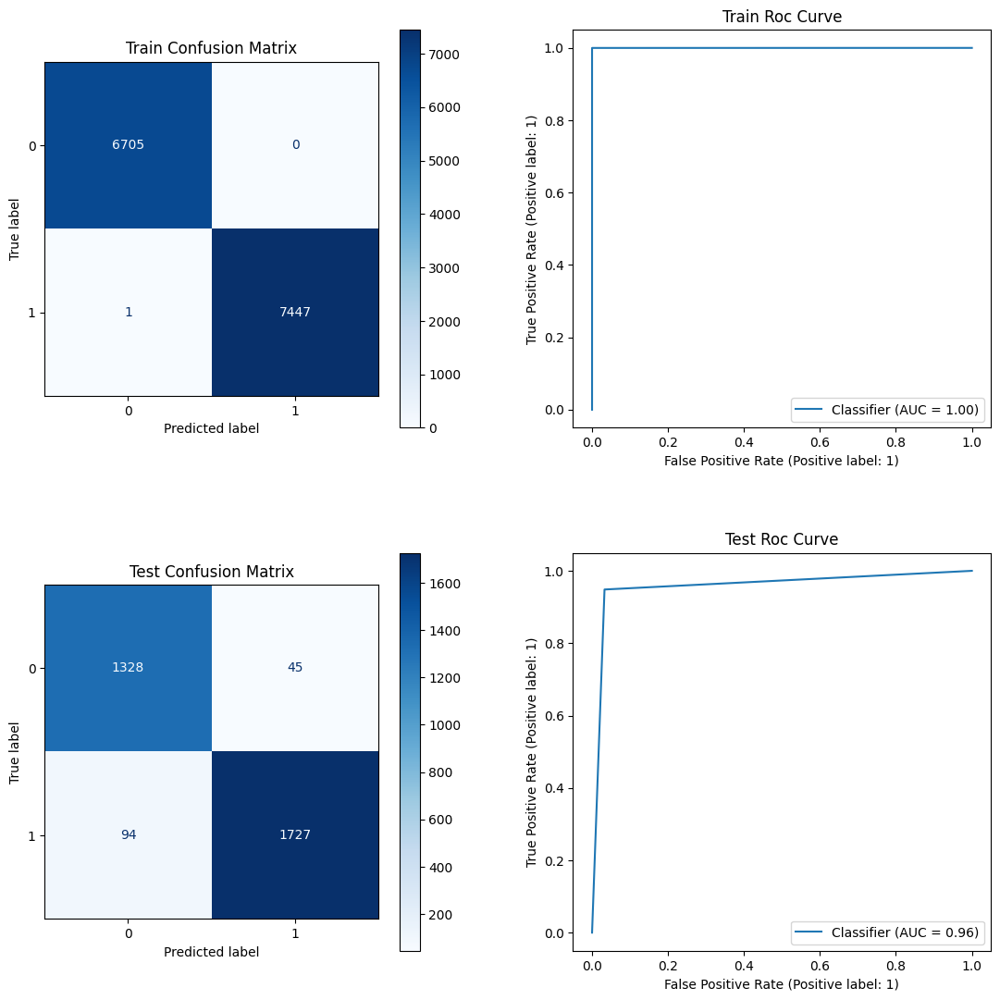

In [ ]:
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[3], knn)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 4 - RandomForest

     Model Name  Accuracy score  Precision score  Recall score  F1 score
0  RandomForest             1.0              1.0           1.0       1.0
     Model Name  Accuracy score  Precision score  Recall score  F1 score
0  RandomForest        0.964621         0.965657      0.964621  0.964711


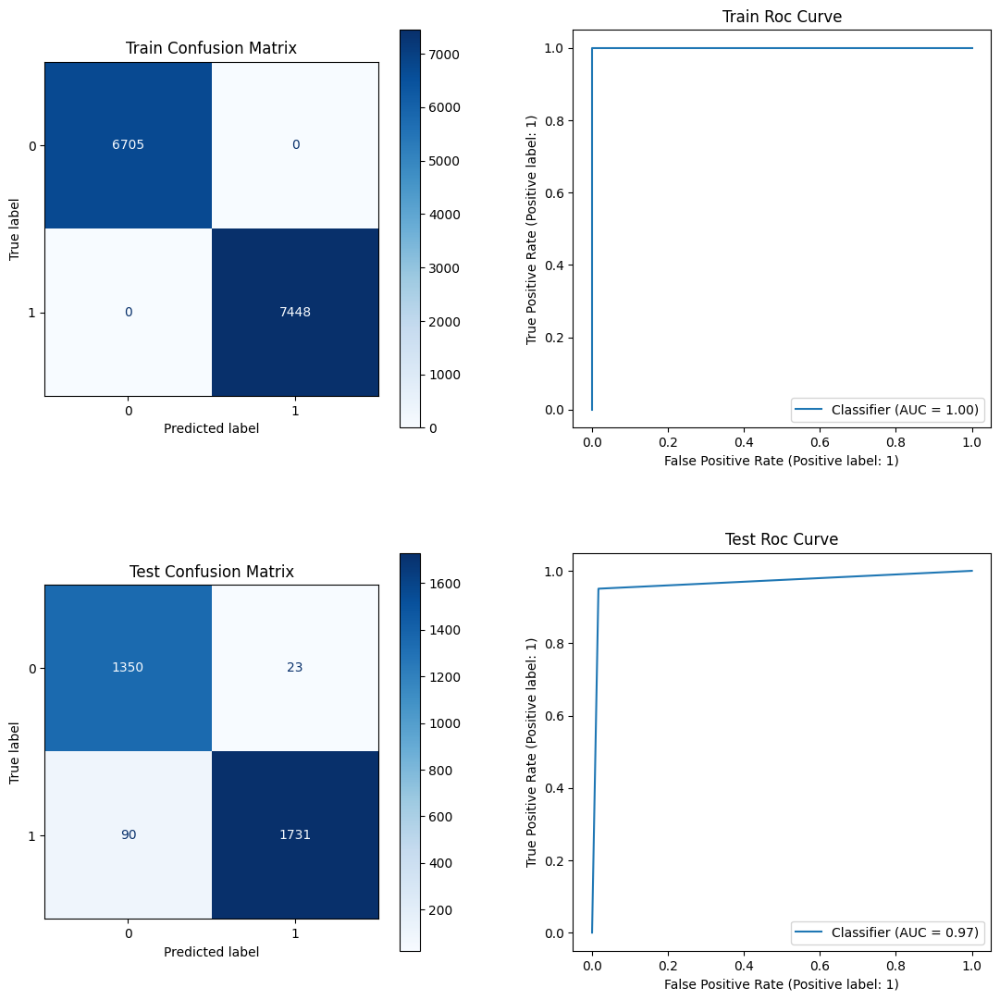

In [ ]:
rf = RandomForestClassifier(random_state=8)
rf.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[4], rf)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 5 - Bagging

  Model Name  Accuracy score  Precision score  Recall score  F1 score
0    Bagging        0.999505         0.999506      0.999505  0.999505
  Model Name  Accuracy score  Precision score  Recall score  F1 score
0    Bagging        0.939261         0.943722      0.939261  0.939526


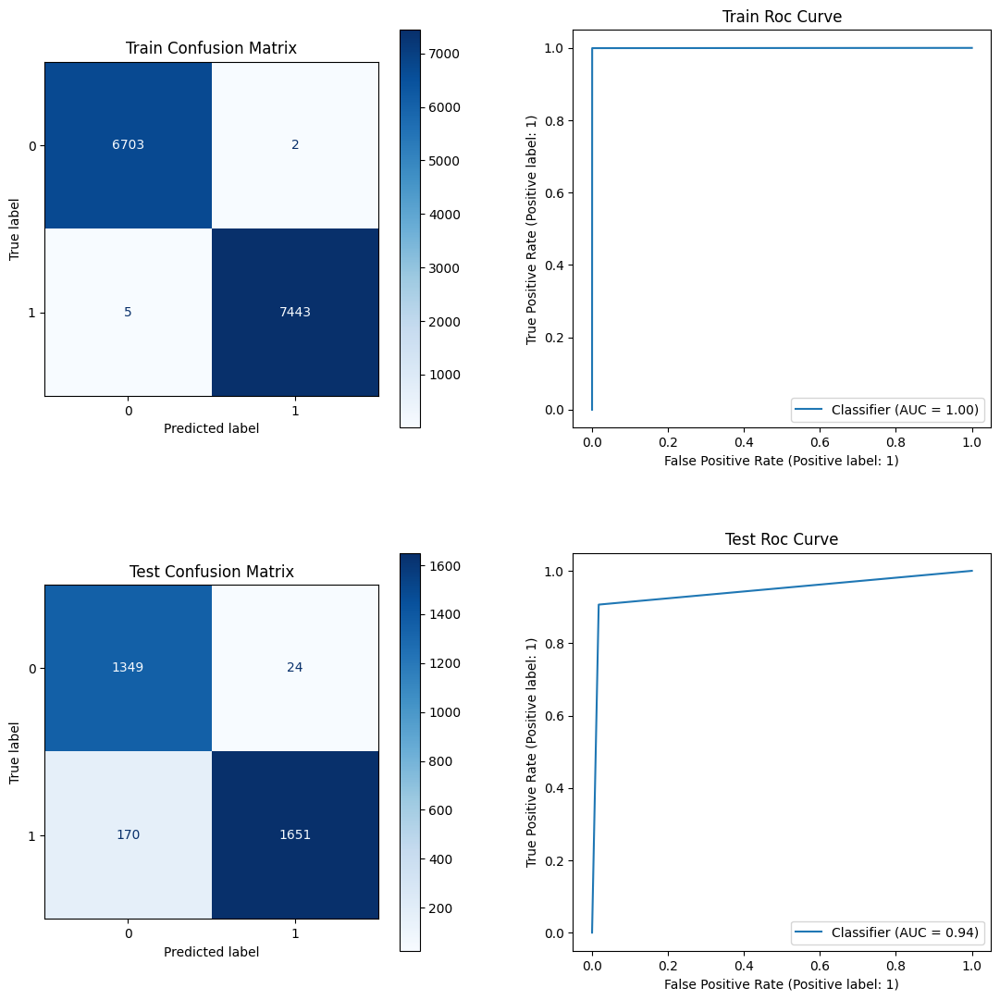

In [ ]:
bg = BaggingClassifier(random_state=8)
bg.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[5], bg)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

### Model 6 - XGB

  Model Name  Accuracy score  Precision score  Recall score  F1 score
0        XGB        0.999859         0.999859      0.999859  0.999859
  Model Name  Accuracy score  Precision score  Recall score  F1 score
0        XGB        0.980589         0.980719      0.980589  0.980607


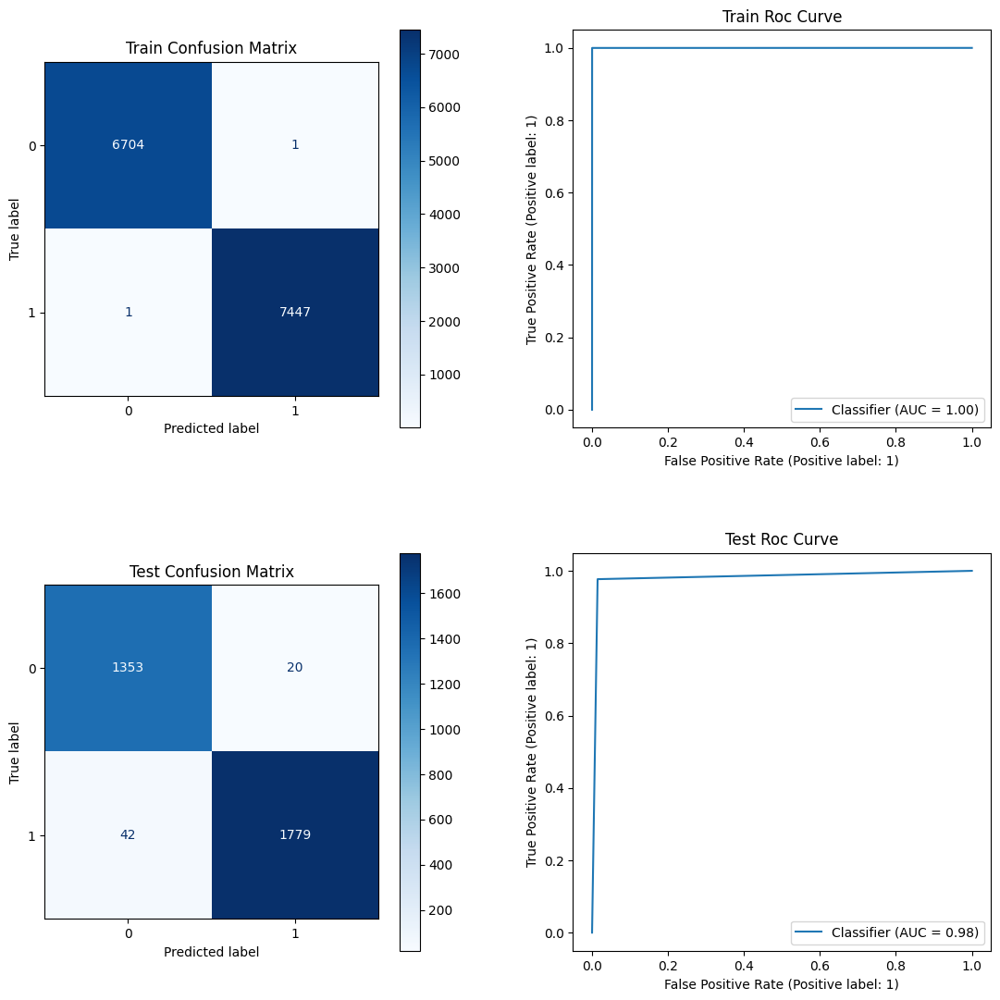

In [ ]:
xgb = XGBClassifier(random_state=8)
xgb.fit(X_train_final, y_train_final)

results = pre_result_calculator(best_models[6], xgb)
train, test = results[0], results[1]
train_score, test_score = results[2], results[3]

print(train_score)
print(test_score)
plot(train, test)

## Results

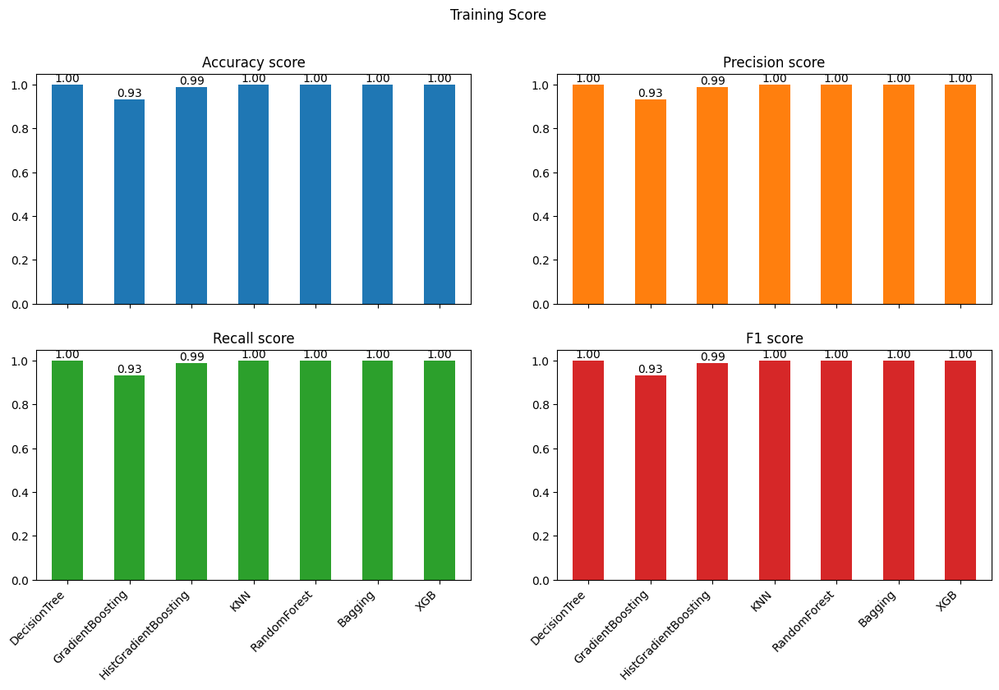

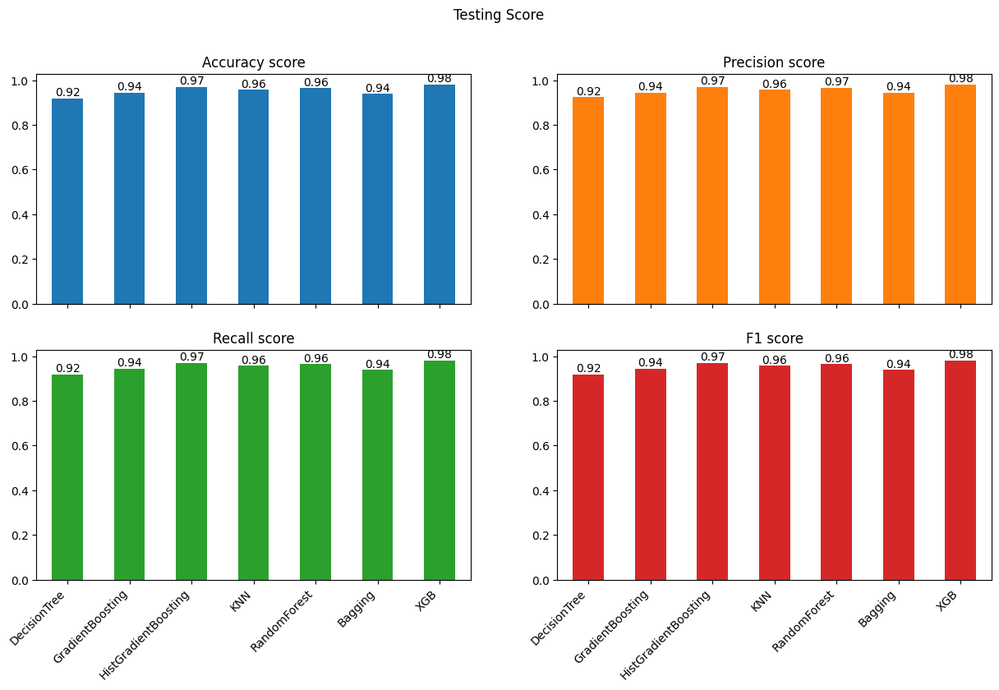

In [ ]:
# @title Graph

ax = pd.DataFrame(train_results).plot(kind='bar', subplots=True, layout=(2, 2), figsize=(15, 8), title='Training Score')
ax = ax.flatten()
for axes in ax:
    axes.get_legend().remove()
    axes.bar_label(axes.containers[0], fmt='%.2f')
    axes.set_xticklabels(best_models, rotation=45, ha='right')

ax = pd.DataFrame(test_results).plot(kind='bar', subplots=True, layout=(2, 2), figsize=(15, 8), title='Testing Score')
ax = ax.flatten()
for axes in ax:
    axes.get_legend().remove()
    axes.bar_label(axes.containers[0], fmt='%.2f')
    axes.set_xticklabels(best_models, rotation=45, ha='right');

## Tuning the model

In [ ]:
train_tuned_results, test_tuned_results = [], []

def pre_tuned_result_calculator(name, model):
    train_pred = model.predict(X_train_final)
    test_pred = model.predict(X_test_final)

    train_score = calculate_results(name, y_train_final, train_pred)
    test_score = calculate_results(name, y_test_final, test_pred)

    train_tuned_results.append(train_score)
    test_tuned_results.append(test_score)

    return (y_train_final, train_pred), \
     (y_test_final, test_pred), \
     pd.DataFrame(train_score, index=[0]), \
     pd.DataFrame(test_score, index=[0])

### GradientBoosting Tuning

In [ ]:
gb_tuned = GradientBoostingClassifier(random_state=8)

weights = np.linspace(0.0, 0.50, 100)

params = {
    # 'loss': ['log_loss', 'exponential'],
    # 'criterion': ['friedman_mse', 'squared_error'],
    # 'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 4, 5],
    'max_features': [None, 'auto', 'sqrt'],
    'n_estimators': [100, 120, 140, 160],
}

grid = GridSearchCV(gb_tuned, params, scoring='f1', cv=StratifiedKFold(), n_jobs=-1)
grid.fit(X_train_final, y_train_final)
gb_tuned = grid.best_estimator_
gb_tuned

GradientBoostingClassifier(max_depth=5, max_features='sqrt', n_estimators=160,
                           random_state=8)

In [ ]:
GradientBoostingClassifier().get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [ ]:
print(GradientBoostingClassifier.__doc__)

Gradient Boosting for classification.

    This algorithm builds an additive model in a forward stage-wise fashion; it
    allows for the optimization of arbitrary differentiable loss functions. In
    each stage ``n_classes_`` regression trees are fit on the negative gradient
    of the loss function, e.g. binary or multiclass log loss. Binary
    classification is a special case where only a single regression tree is
    induced.

    :class:`sklearn.ensemble.HistGradientBoostingClassifier` is a much faster
    variant of this algorithm for intermediate datasets (`n_samples >= 10_000`).

    Read more in the :ref:`User Guide <gradient_boosting>`.

    Parameters
    ----------
    loss : {'log_loss', 'deviance', 'exponential'}, default='log_loss'
        The loss function to be optimized. 'log_loss' refers to binomial and
        multinomial deviance, the same as used in logistic regression.
        It is a good choice for classification with probabilistic outputs.
        For loss '

              Model Name  Accuracy score  Precision score  Recall score  \
0  GradientBoostingTuned        0.982265         0.982271      0.982265   

   F1 score  
0  0.982266  
              Model Name  Accuracy score  Precision score  Recall score  \
0  GradientBoostingTuned        0.960551          0.96106      0.960551   

   F1 score  
0  0.960621  


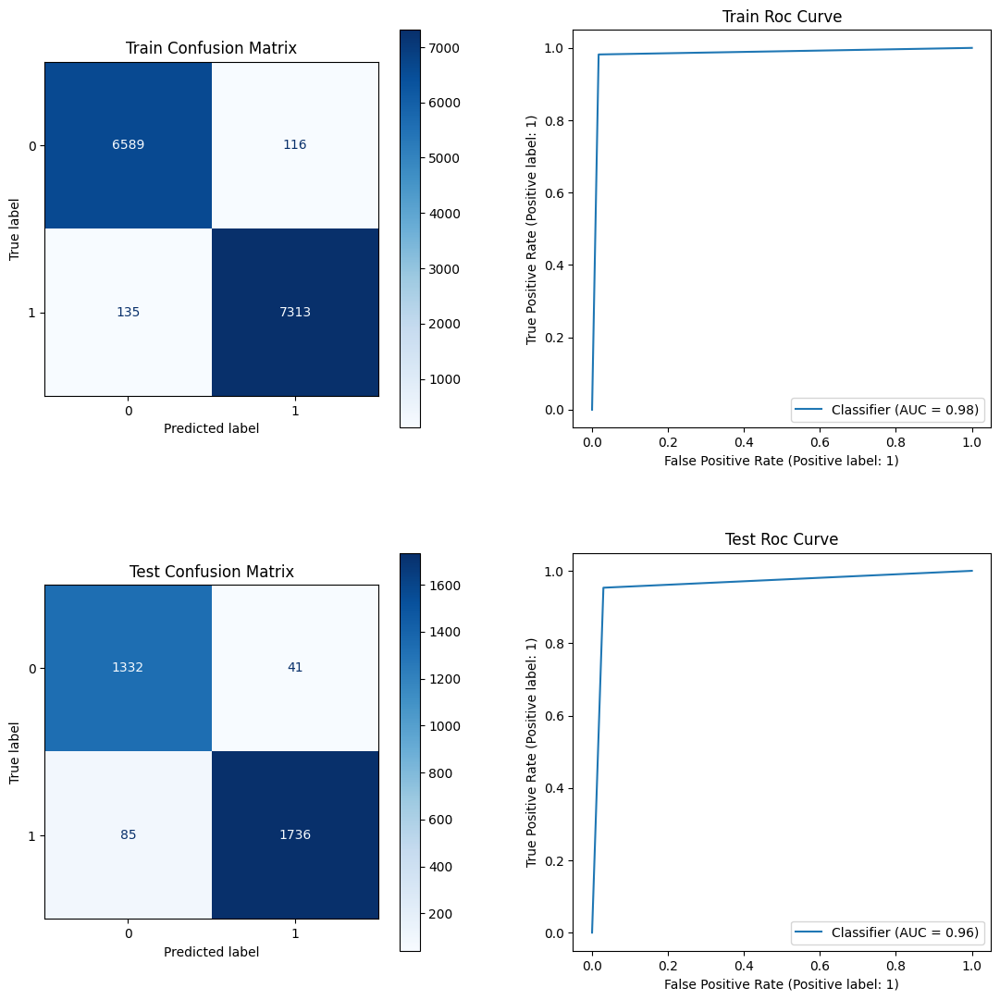

In [ ]:
gb_tuned.fit(X_train_final, y_train_final)
results = pre_tuned_result_calculator(best_models[1]+'Tuned', gb_tuned)
train, val = results[0], results[1]
train_score, val_score = results[2], results[3]

print(train_score)
print(val_score)
plot(train, val)

## Final Results

In [ ]:
pd.DataFrame(test_results).sort_values('Recall score', ascending=False)

,Model Name,Accuracy score,Precision score,Recall score,F1 score
6,XGB,0.980589,0.980719,0.980589,0.980607
2,HistGradientBoosting,0.970883,0.971090,0.970883,0.970916
4,RandomForest,0.964621,0.965657,0.964621,0.964711
3,KNN,0.956481,0.957105,0.956481,0.956566
1,GradientBoosting,0.943331,0.944140,0.943331,0.943453
5,Bagging,0.939261,0.943722,0.939261,0.939526
0,DecisionTree,0.918910,0.924086,0.918910,0.919277


## Data Insights (Best Model)

> It's found the best model so far is `XGB`. We got `100%` results on training dataset on all the metrics (Accuracy, Precision, Recall, F1-score) and around `98%` on testing dataset on all the metrics.

## Saving the Best Model

In [ ]:
from joblib import load, dump

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/Jain/best_model.joblib'

best_model = dump(xgb, path)

## Loading the Best Model

In [ ]:
saved_model = load(path)

In [ ]:
saved_model.score(X_test_final, y_test_final)

0.9805886036318097

---
---